In [1]:
# 第三步：验证 PyTorch 是否正常工作
# 注意：需要重启 Jupyter 内核后再运行此段
import torch
print(f"✅ PyTorch 版本: {torch.__version__}")
print(f"CUDA 可用: {torch.cuda.is_available()}")

import scanpy as sc
print(f"✅ Scanpy 版本: {sc.__version__}")
print("\n所有依赖正常！")

✅ PyTorch 版本: 2.10.0+cpu
CUDA 可用: False
✅ Scanpy 版本: 1.11.5

所有依赖正常！


C:\Users\13918\AppData\Local\Temp\ipykernel_63268\1257427140.py:8: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  print(f"✅ Scanpy 版本: {sc.__version__}")


In [2]:
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# 检查 gsMap_example_data 的实际结构
example_dir = os.path.join(base_dir, 'gsMap_example_data')
print("gsMap_example_data 目录结构：")
print("=" * 60)
for root, dirs, files in os.walk(example_dir):
    level = root.replace(example_dir, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f'{indent}{os.path.basename(root)}/')
    subindent = ' ' * 2 * (level + 1)
    for file in files:
        print(f'{subindent}{file}')

print("\n" + "=" * 60)

# 检查 gsMap_resource 的结构（只看前两层）
resource_dir = os.path.join(base_dir, 'gsMap_resource')
print("\ngsMap_resource 目录结构（前两层）：")
print("=" * 60)
for root, dirs, files in os.walk(resource_dir):
    level = root.replace(resource_dir, '').count(os.sep)
    if level < 2:
        indent = ' ' * 2 * level
        print(f'{indent}{os.path.basename(root)}/')
        if level == 1:
            subindent = ' ' * 2 * (level + 1)
            for file in files:
                print(f'{subindent}{file}')

gsMap_example_data 目录结构：
gsMap_example_data/
  gsMap_example_data/
    GWAS/
      BCX2_MCHC_EA_GWAMA.sumstats.gz
      GIANT_EUR_Height_2022_Nature.sumstats.gz
      gwas_config.yaml
      IQ_NG_2018.sumstats.gz
    ST/
      E16.5_E1S1.MOSTA.h5ad
      E16.5_E2S11.MOSTA.h5ad
  GWAS/
    BCX2_MCHC_EA_GWAMA.sumstats.gz
    GIANT_EUR_Height_2022_Nature.sumstats.gz
    gwas_config.yaml
    IQ_NG_2018.sumstats.gz
  ST/
    E16.5_E1S1.MOSTA.h5ad
    E16.5_E2S11.MOSTA.h5ad


gsMap_resource 目录结构（前两层）：
gsMap_resource/
  genome_annotation/
  gsMap_resource/
  homologs/
    human_macaque_marmoset_mouse_homologs.txt.gz
    macaque_human_homologs.txt
    mouse_human_homologs.txt
  LDSC_resource/
  LD_Reference_Panel/
  quick_mode/
    snp_gene_weight_matrix.h5ad


In [3]:
# 检查关键文件存在于哪个路径
possible_h5ad_paths = [
    os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad'),
    os.path.join(base_dir, 'gsMap_example_data', 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad'),
]

print("检查 h5ad 文件位置：")
for p in possible_h5ad_paths:
    exists = os.path.exists(p)
    if exists:
        size_mb = os.path.getsize(p) / (1024 * 1024)
        print(f"  ✅ {p}  ({size_mb:.1f} MB)")
    else:
        print(f"  ❌ {p}")

print()

# 检查 GWAS 文件
possible_gwas_paths = [
    os.path.join(base_dir, 'gsMap_example_data', 'GWAS', 'IQ_NG_2018.sumstats.gz'),
    os.path.join(base_dir, 'gsMap_example_data', 'gsMap_example_data', 'GWAS', 'IQ_NG_2018.sumstats.gz'),
]

print("检查 GWAS 文件位置：")
for p in possible_gwas_paths:
    exists = os.path.exists(p)
    if exists:
        size_mb = os.path.getsize(p) / (1024 * 1024)
        print(f"  ✅ {p}  ({size_mb:.1f} MB)")
    else:
        print(f"  ❌ {p}")

print()

# 检查 gsMap_resource 关键文件
resource_checks = {
    'homolog_file': os.path.join(base_dir, 'gsMap_resource', 'homologs', 'mouse_human_homologs.txt'),
    'quick_mode目录': os.path.join(base_dir, 'gsMap_resource', 'quick_mode'),
    'snp_gene_weight': os.path.join(base_dir, 'gsMap_resource', 'quick_mode', 'snp_gene_weight_matrix.h5ad'),
    'baseline': os.path.join(base_dir, 'gsMap_resource', 'quick_mode', 'baseline'),
    'SNP_gene_pair': os.path.join(base_dir, 'gsMap_resource', 'quick_mode', 'SNP_gene_pair'),
    'LDSC_resource': os.path.join(base_dir, 'gsMap_resource', 'LDSC_resource'),
}

print("检查 gsMap_resource 关键文件：")
for name, p in resource_checks.items():
    exists = os.path.exists(p)
    status = "✅" if exists else "❌"
    print(f"  {status} {name}: {p}")

检查 h5ad 文件位置：
  ✅ C:\Users\13918\Desktop\MR\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad  (4542.2 MB)
  ✅ C:\Users\13918\Desktop\MR\gsMap_example_data\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad  (4542.2 MB)

检查 GWAS 文件位置：
  ✅ C:\Users\13918\Desktop\MR\gsMap_example_data\GWAS\IQ_NG_2018.sumstats.gz  (61.6 MB)
  ✅ C:\Users\13918\Desktop\MR\gsMap_example_data\gsMap_example_data\GWAS\IQ_NG_2018.sumstats.gz  (61.6 MB)

检查 gsMap_resource 关键文件：
  ✅ homolog_file: C:\Users\13918\Desktop\MR\gsMap_resource\homologs\mouse_human_homologs.txt
  ✅ quick_mode目录: C:\Users\13918\Desktop\MR\gsMap_resource\quick_mode
  ✅ snp_gene_weight: C:\Users\13918\Desktop\MR\gsMap_resource\quick_mode\snp_gene_weight_matrix.h5ad
  ✅ baseline: C:\Users\13918\Desktop\MR\gsMap_resource\quick_mode\baseline
  ✅ SNP_gene_pair: C:\Users\13918\Desktop\MR\gsMap_resource\quick_mode\SNP_gene_pair
  ✅ LDSC_resource: C:\Users\13918\Desktop\MR\gsMap_resource\LDSC_resource


In [4]:
import psutil

# 检查系统内存
mem = psutil.virtual_memory()
print(f"总内存: {mem.total / (1024**3):.1f} GB")
print(f"可用内存: {mem.available / (1024**3):.1f} GB")
print(f"已使用: {mem.percent}%")

if mem.total / (1024**3) < 80:
    print(f"\n⚠️ 警告：gsMap Quick Mode 建议 80GB 内存，您的系统只有 {mem.total / (1024**3):.1f} GB")
    print("分析可能会因内存不足而失败，但可以先试试。")
else:
    print("\n✅ 内存充足，可以运行分析。")

总内存: 31.1 GB
可用内存: 16.0 GB
已使用: 48.5%

⚠️ 警告：gsMap Quick Mode 建议 80GB 内存，您的系统只有 31.1 GB
分析可能会因内存不足而失败，但可以先试试。


In [5]:
import scanpy as sc
import os

base_dir = r'C:\Users\13918\Desktop\MR'
hdf5_path = os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad')

print("正在读取 h5ad 文件基本信息...")
adata = sc.read_h5ad(hdf5_path, backed='r')

print(f"细胞数量: {adata.n_obs}")
print(f"基因数量: {adata.n_vars}")
print(f"\nobs 列名: {list(adata.obs.columns)}")

if 'annotation' in adata.obs.columns:
    print(f"\nannotation 类别（前15个）:")
    print(adata.obs['annotation'].value_counts().head(15))
else:
    print("⚠️ 没有找到 'annotation' 列")
    print(f"可用的列: {list(adata.obs.columns)}")

print(f"\nlayers: {list(adata.layers.keys())}")

adata.file.close()

正在读取 h5ad 文件基本信息...
细胞数量: 121767
基因数量: 28204

obs 列名: ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - AI987944', 'Regulon - Alx1', 'Regulon - Alx4', 'Regulon - Arid3a', 'Regulon - Arnt2', 'Regulon - Arx', 'Regulon - Atf1', 'Regulon - Atf2', 'Regulon - Atf3', 'Regulon - Atf4', 'Regulon - Atf6', 'Regulon - Atoh1', 'Regulon - Bach2', 'Regulon - Barhl1', 'Regulon - Barhl2', 'Regulon - Barx1', 'Regulon - Bcl6', 'Regulon - Bclaf1', 'Regulon - Bdp1', 'Regulon - Bhlhe40', 'Regulon - Bmyc', 'Regulon - Brca1', 'Regulon - Brf1', 'Regulon - Brf2', 'Regulon - Cdx1', 'Regulon - Cdx2', 'Regulon - Cebpa', 'Regulon - Cebpb', 'Regulon - Cebpe', 'Regulon - Cic', 'Regulon - Clock', 'Regulon - Creb1', 'Regulon - Creb3l1', 'Regulon - Creb3l2', 'Regulon - Creb5', 'Regulon - Crebl2', 'Regulon - Ctcf', 'Regulon - Ctcfl', 'Regulon - Cux1', 'Regulon - Dbp', 'Regulon - Dbx1', 'Regulon - Ddit3', 'Regulon - Dlx1', 'Regulon - Dlx2', 'Regulon - Dlx3', 'R

In [6]:
import scanpy as sc
import os

base_dir = r'C:\Users\13918\Desktop\MR'
hdf5_path_2 = os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E2S11.MOSTA.h5ad')

print("正在读取第二个 h5ad 文件基本信息...")
adata2 = sc.read_h5ad(hdf5_path_2, backed='r')

print(f"细胞数量: {adata2.n_obs}")
print(f"基因数量: {adata2.n_vars}")

if 'annotation' in adata2.obs.columns:
    print(f"\nannotation 类别数量: {adata2.obs['annotation'].nunique()}")
    
print(f"layers: {list(adata2.layers.keys())}")

adata2.file.close()

# 对比
print("\n" + "=" * 40)
print("数据对比：")
print(f"E16.5_E1S1: 121,767 细胞")
print(f"E16.5_E2S11: {adata2.n_obs} 细胞")

正在读取第二个 h5ad 文件基本信息...
细胞数量: 109399
基因数量: 27945

annotation 类别数量: 18
layers: ['count']

数据对比：
E16.5_E1S1: 121,767 细胞
E16.5_E2S11: 109399 细胞


In [7]:
import subprocess
import sys
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# 定义所有路径
workdir = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo')
homolog_file = os.path.join(base_dir, 'gsMap_resource', 'homologs', 'mouse_human_homologs.txt')
resource_dir = os.path.join(base_dir, 'gsMap_resource')
hdf5_path = os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad')
sumstats_file = os.path.join(base_dir, 'gsMap_example_data', 'GWAS', 'IQ_NG_2018.sumstats.gz')

# 创建工作目录
os.makedirs(workdir, exist_ok=True)

# 构建命令
cmd = [
    sys.executable, '-m', 'gsMap', 'quick_mode',
    '--workdir', workdir,
    '--homolog_file', homolog_file,
    '--sample_name', 'E16.5_E1S1.MOSTA',
    '--gsMap_resource_dir', resource_dir,
    '--hdf5_path', hdf5_path,
    '--annotation', 'annotation',
    '--data_layer', 'count',
    '--sumstats_file', sumstats_file,
    '--trait_name', 'IQ'
]

print("运行命令：")
print(' '.join(cmd))
print("\n" + "=" * 60)
print("开始 gsMap 分析...")
print("⚠️ 这可能需要较长时间，请耐心等待...")
print("⚠️ 如果内存不足，程序会报错或被系统终止")
print("=" * 60 + "\n")

运行命令：
C:\Users\13918\miniconda3\envs\gsMap\python.exe -m gsMap quick_mode --workdir C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo --homolog_file C:\Users\13918\Desktop\MR\gsMap_resource\homologs\mouse_human_homologs.txt --sample_name E16.5_E1S1.MOSTA --gsMap_resource_dir C:\Users\13918\Desktop\MR\gsMap_resource --hdf5_path C:\Users\13918\Desktop\MR\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad --annotation annotation --data_layer count --sumstats_file C:\Users\13918\Desktop\MR\gsMap_example_data\GWAS\IQ_NG_2018.sumstats.gz --trait_name IQ

开始 gsMap 分析...
⚠️ 这可能需要较长时间，请耐心等待...
⚠️ 如果内存不足，程序会报错或被系统终止



In [9]:
# 开始运行（实时输出）
process = subprocess.Popen(
    cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    bufsize=1
)

for line in process.stdout:
    print(line, end='')

return_code = process.wait()

print("\n" + "=" * 60)
if return_code == 0:
    print("✅ gsMap 分析完成！")
else:
    print(f"❌ gsMap 分析失败，返回码: {return_code}")

                                   ___  ___            
                                   |  \/  |            
                          __ _ ___ | .  . | __ _ _ __  
                         / _` / __|| |\/| |/ _` | '_ \ 
                        | (_| \__ \| |  | | (_| | |_) |
                         \__, |___/\_|  |_/\__,_| .__/ 
                          __/ |                 | |    
                         |___/                  |_|
                                Version: 1.73.7                                 
[2026-02-28 09:53:42,347] INFO | gsMap - Running quick_mode...
[2026-02-28 09:53:42,347] INFO | gsMap - Started at: 2026-02-28 09:53:42
[2026-02-28 09:53:47,148] INFO | gsMap - Resource usage summary:
[2026-02-28 09:53:47,148] INFO | gsMap -   \u2022 Wall clock time: 4.81 seconds
[2026-02-28 09:53:47,148] INFO | gsMap -   \u2022 CPU time: 1.39 seconds
[2026-02-28 09:53:47,151] INFO | gsMap -   \u2022 Average CPU utilization: 59.4%
[2026-02-28 09:53:47,151] INFO | gsMap -

In [10]:
import subprocess
import sys
import shutil
import os

print("=" * 60)
print("彻底清理 PyTorch")
print("=" * 60)

# 1. 卸载
print("\n1. 卸载 torch...")
subprocess.run([sys.executable, '-m', 'pip', 'uninstall', 'torch', '-y'], 
               capture_output=True)

# 2. 手动删除残留文件
site_packages = os.path.dirname(os.path.dirname(subprocess.__file__))
# 更准确地获取 site-packages 路径
result = subprocess.run([sys.executable, '-c', 
    'import site; print(site.getsitepackages()[0])'], 
    capture_output=True, text=True)
site_packages = result.stdout.strip()
print(f"\nsite-packages 路径: {site_packages}")

torch_path = os.path.join(site_packages, 'torch')
if os.path.exists(torch_path):
    print(f"\n2. 删除残留的 torch 目录: {torch_path}")
    try:
        shutil.rmtree(torch_path)
        print("   ✅ 删除成功")
    except Exception as e:
        print(f"   ❌ 删除失败: {e}")
        print("   请手动删除该目录后重试")
else:
    print("\n2. torch 目录已不存在 ✅")

# 检查是否还有其他 torch 相关文件
print("\n3. 检查其他 torch 相关文件...")
for item in os.listdir(site_packages):
    if 'torch' in item.lower():
        full_path = os.path.join(site_packages, item)
        print(f"   发现: {item}")
        try:
            if os.path.isdir(full_path):
                shutil.rmtree(full_path)
            else:
                os.remove(full_path)
            print(f"   ✅ 已删除")
        except Exception as e:
            print(f"   ❌ 无法删除: {e}")

彻底清理 PyTorch

1. 卸载 torch...

site-packages 路径: C:\Users\13918\miniconda3\envs\gsMap

2. torch 目录已不存在 ✅

3. 检查其他 torch 相关文件...


In [11]:
import subprocess
import sys
import shutil
import os

# 获取正确的 site-packages 路径
result = subprocess.run(
    [sys.executable, '-c', 'import torch; print(torch.__file__)'],
    capture_output=True, text=True
)

if result.returncode == 0:
    torch_init = result.stdout.strip()
    torch_path = os.path.dirname(torch_init)
    site_packages = os.path.dirname(torch_path)
    print(f"torch 安装位置: {torch_path}")
    print(f"site-packages: {site_packages}")
else:
    # 备用方法
    result = subprocess.run(
        [sys.executable, '-c', 
         'import sysconfig; print(sysconfig.get_path("purelib"))'],
        capture_output=True, text=True
    )
    site_packages = result.stdout.strip()
    torch_path = os.path.join(site_packages, 'torch')
    print(f"site-packages (备用方法): {site_packages}")
    print(f"torch 可能位置: {torch_path}")

print(f"\ntorch 目录存在: {os.path.exists(torch_path)}")

# 列出 site-packages 中的 torch 相关内容
print("\n检查 torch 相关文件/目录:")
if os.path.exists(site_packages):
    for item in os.listdir(site_packages):
        if 'torch' in item.lower():
            full_path = os.path.join(site_packages, item)
            is_dir = "📁" if os.path.isdir(full_path) else "📄"
            print(f"  {is_dir} {item}")

site-packages (备用方法): C:\Users\13918\miniconda3\envs\gsMap\Lib\site-packages
torch 可能位置: C:\Users\13918\miniconda3\envs\gsMap\Lib\site-packages\torch

torch 目录存在: False

检查 torch 相关文件/目录:
  📁 torch_geometric
  📁 torch_geometric-2.7.0.dist-info


In [12]:
import subprocess
import sys

print("重新安装 PyTorch CPU 版本...")
print("=" * 60)

result = subprocess.run(
    [sys.executable, '-m', 'pip', 'install', 'torch', '--index-url', 'https://download.pytorch.org/whl/cpu'],
    capture_output=False,  # 直接显示输出
    text=True
)

print("\n" + "=" * 60)
print("验证安装...")

# 验证
verify_result = subprocess.run(
    [sys.executable, '-c', 'import torch; print(f"PyTorch {torch.__version__} 安装成功")'],
    capture_output=True, text=True
)

if verify_result.returncode == 0:
    print(verify_result.stdout)
else:
    print("验证失败:")
    print(verify_result.stderr)

重新安装 PyTorch CPU 版本...

验证安装...
PyTorch 2.10.0+cpu 安装成功



In [13]:
import subprocess
import sys
import os

print("=" * 60)
print("使用 Conda 安装 PyTorch CPU 版本")
print("=" * 60)

# 获取 conda 路径
conda_path = os.path.join(os.path.dirname(sys.executable), 'conda.exe')
if not os.path.exists(conda_path):
    # 尝试 Scripts 目录
    conda_path = os.path.join(os.path.dirname(sys.executable), '..', 'Scripts', 'conda.exe')
if not os.path.exists(conda_path):
    # 尝试从环境变量
    conda_path = 'conda'

print(f"Conda 路径: {conda_path}")
print(f"当前环境: gsMap")

# 先用 pip 彻底卸载
print("\n1. 先用 pip 卸载残留...")
subprocess.run([sys.executable, '-m', 'pip', 'uninstall', 'torch', '-y'], 
               capture_output=True)

# 使用 conda 安装 pytorch cpu 版本
print("\n2. 使用 conda 安装 PyTorch CPU 版本...")
print("   (这可能需要几分钟，请耐心等待...)\n")

result = subprocess.run(
    ['conda', 'install', '-n', 'gsMap', 'pytorch', 'cpuonly', '-c', 'pytorch', '-y'],
    capture_output=False,
    text=True,
    shell=True
)

使用 Conda 安装 PyTorch CPU 版本
Conda 路径: conda
当前环境: gsMap

1. 先用 pip 卸载残留...

2. 使用 conda 安装 PyTorch CPU 版本...
   (这可能需要几分钟，请耐心等待...)



In [14]:
import subprocess
import sys

print("验证 PyTorch 安装...")
print("=" * 60)

result = subprocess.run(
    [sys.executable, '-c', '''
import torch
print(f"PyTorch 版本: {torch.__version__}")
print(f"CUDA 可用: {torch.cuda.is_available()}")
print("torch 导入成功!")
'''],
    capture_output=True, text=True
)

if result.returncode == 0:
    print(result.stdout)
    print("✅ PyTorch 安装成功！")
else:
    print("❌ 验证失败:")
    print(result.stderr)

验证 PyTorch 安装...
PyTorch 版本: 2.5.1
CUDA 可用: False
torch 导入成功!

✅ PyTorch 安装成功！


In [15]:
import subprocess
import sys
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# 定义所有路径
workdir = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo')
homolog_file = os.path.join(base_dir, 'gsMap_resource', 'homologs', 'mouse_human_homologs.txt')
resource_dir = os.path.join(base_dir, 'gsMap_resource')
hdf5_path = os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad')
sumstats_file = os.path.join(base_dir, 'gsMap_example_data', 'GWAS', 'IQ_NG_2018.sumstats.gz')

# 构建命令
cmd = [
    sys.executable, '-m', 'gsMap', 'quick_mode',
    '--workdir', workdir,
    '--homolog_file', homolog_file,
    '--sample_name', 'E16.5_E1S1.MOSTA',
    '--gsMap_resource_dir', resource_dir,
    '--hdf5_path', hdf5_path,
    '--annotation', 'annotation',
    '--data_layer', 'count',
    '--sumstats_file', sumstats_file,
    '--trait_name', 'IQ'
]

print("=" * 60)
print("开始 gsMap Quick Mode 分析")
print("=" * 60)
print(f"样本: E16.5_E1S1.MOSTA (121,767 细胞)")
print(f"性状: IQ")
print(f"输出目录: {workdir}")
print("=" * 60)
print("\n⏳ 分析可能需要较长时间，请耐心等待...\n")

# 运行
process = subprocess.Popen(
    cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    bufsize=1
)

for line in process.stdout:
    print(line, end='')

return_code = process.wait()

print("\n" + "=" * 60)
if return_code == 0:
    print("✅ gsMap 分析完成！")
else:
    print(f"❌ gsMap 分析失败，返回码: {return_code}")
print("=" * 60)

开始 gsMap Quick Mode 分析
样本: E16.5_E1S1.MOSTA (121,767 细胞)
性状: IQ
输出目录: C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo

⏳ 分析可能需要较长时间，请耐心等待...

                                   ___  ___            
                                   |  \/  |            
                          __ _ ___ | .  . | __ _ _ __  
                         / _` / __|| |\/| |/ _` | '_ \ 
                        | (_| \__ \| |  | | (_| | |_) |
                         \__, |___/\_|  |_/\__,_| .__/ 
                          __/ |                 | |    
                         |___/                  |_|
                                Version: 1.73.7                                 
[2026-02-28 10:07:50,651] INFO | gsMap - Running quick_mode...
[2026-02-28 10:07:50,651] INFO | gsMap - Started at: 2026-02-28 10:07:50
Using the following arguments for RunAllModeConfig:
{   'annotation': 'annotation',
    'data_layer': 'count',
    'gM_slices': None,
    'gsMap_resource_dir': 'C:\\Users\\13918\\Desktop\

In [16]:
import shutil
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# 源目录和目标目录
source_baseline = os.path.join(base_dir, 'gsMap_resource', 'quick_mode', 'baseline')
target_baseline = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo', 'E16.5_E1S1.MOSTA', 'generate_ldscore', 'baseline')

# 确保父目录存在
os.makedirs(os.path.dirname(target_baseline), exist_ok=True)

# 如果目标已存在，先删除
if os.path.exists(target_baseline):
    if os.path.islink(target_baseline):
        os.remove(target_baseline)
    else:
        shutil.rmtree(target_baseline)
    print(f"已删除旧的 baseline 目录")

# 复制目录
print(f"正在复制 baseline 目录...")
print(f"  从: {source_baseline}")
print(f"  到: {target_baseline}")
shutil.copytree(source_baseline, target_baseline)
print("✅ baseline 目录复制完成！")

# 验证
if os.path.exists(target_baseline):
    files = os.listdir(target_baseline)
    print(f"   包含 {len(files)} 个文件/目录")

正在复制 baseline 目录...
  从: C:\Users\13918\Desktop\MR\gsMap_resource\quick_mode\baseline
  到: C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\generate_ldscore\baseline
✅ baseline 目录复制完成！
   包含 66 个文件/目录


In [ ]:
import subprocess
import sys
import os

base_dir = r'C:\Users\13918\Desktop\MR'

workdir = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo')
homolog_file = os.path.join(base_dir, 'gsMap_resource', 'homologs', 'mouse_human_homologs.txt')
resource_dir = os.path.join(base_dir, 'gsMap_resource')
hdf5_path = os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad')
sumstats_file = os.path.join(base_dir, 'gsMap_example_data', 'GWAS', 'IQ_NG_2018.sumstats.gz')

cmd = [
    sys.executable, '-m', 'gsMap', 'quick_mode',
    '--workdir', workdir,
    '--homolog_file', homolog_file,
    '--sample_name', 'E16.5_E1S1.MOSTA',
    '--gsMap_resource_dir', resource_dir,
    '--hdf5_path', hdf5_path,
    '--annotation', 'annotation',
    '--data_layer', 'count',
    '--sumstats_file', sumstats_file,
    '--trait_name', 'IQ'
]

print("=" * 60)
print("重新运行 gsMap Quick Mode 分析")
print("=" * 60)

process = subprocess.Popen(
    cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    bufsize=1
)

for line in process.stdout:
    print(line, end='')

return_code = process.wait()

print("\n" + "=" * 60)
if return_code == 0:
    print("✅ gsMap 分析完成！")
else:
    print(f"❌ gsMap 分析失败，返回码: {return_code}")
print("=" * 60)

重新运行 gsMap Quick Mode 分析
                                   ___  ___            
                                   |  \/  |            
                          __ _ ___ | .  . | __ _ _ __  
                         / _` / __|| |\/| |/ _` | '_ \ 
                        | (_| \__ \| |  | | (_| | |_) |
                         \__, |___/\_|  |_/\__,_| .__/ 
                          __/ |                 | |    
                         |___/                  |_|
                                Version: 1.73.7                                 
[2026-02-28 14:55:56,184] INFO | gsMap - Running quick_mode...
[2026-02-28 14:55:56,184] INFO | gsMap - Started at: 2026-02-28 14:55:56
Using the following arguments for RunAllModeConfig:
{   'annotation': 'annotation',
    'data_layer': 'count',
    'gM_slices': None,
    'gsMap_resource_dir': 'C:\\Users\\13918\\Desktop\\MR\\gsMap_resource',
    'hdf5_path': 'C:\\Users\\13918\\Desktop\\MR\\gsMap_example_data\\ST\\E16.5_E1S1.MOSTA.h5ad',
    'hom

In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# 加载空间转录组数据
hdf5_path = os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad')
print("正在加载数据...")
adata = sc.read_h5ad(hdf5_path)
print(f"数据加载完成: {adata.n_obs} 细胞, {adata.n_vars} 基因")

# 查看空间坐标
print(f"\n空间坐标信息:")
print(f"  obsm keys: {list(adata.obsm.keys())}")

正在加载数据...
数据加载完成: 121767 细胞, 28204 基因

空间坐标信息:
  obsm keys: ['spatial']


✅ 将展示以下基因: ['Gad1', 'Gad2', 'Slc17a7', 'Neurod1', 'Sox2']


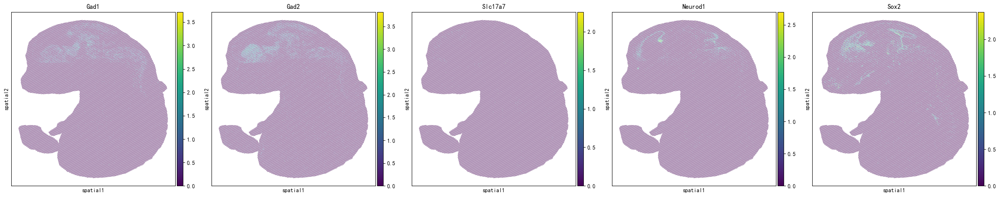


图片已保存到: C:\Users\13918\Desktop\MR\gene_expression_spatial.png


In [2]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设置中文字体支持（如果需要）
plt.rcParams['font.sans-serif'] = ['SimHei', 'Arial']
plt.rcParams['axes.unicode_minus'] = False

# ============================================================
# 🔧 在这里设置你想展示的基因列表
# ============================================================
genes_to_plot = ['Gad1', 'Gad2', 'Slc17a7', 'Neurod1', 'Sox2']  # 替换为你感兴趣的基因
# ============================================================

# 检查哪些基因存在于数据中
available_genes = [g for g in genes_to_plot if g in adata.var_names]
missing_genes = [g for g in genes_to_plot if g not in adata.var_names]

if missing_genes:
    print(f"⚠️ 以下基因不在数据中: {missing_genes}")
print(f"✅ 将展示以下基因: {available_genes}")

# 使用 count layer 进行归一化（如果还没做）
if 'normalized' not in adata.layers:
    adata.layers['normalized'] = adata.layers['count'].copy()
    sc.pp.normalize_total(adata, layer='normalized')
    sc.pp.log1p(adata, layer='normalized')

# 设置绘图用的表达矩阵
adata.X = adata.layers['normalized']

# 绘制多个基因的空间表达
fig, axes = plt.subplots(1, len(available_genes), figsize=(5*len(available_genes), 5))

if len(available_genes) == 1:
    axes = [axes]

for idx, gene in enumerate(available_genes):
    sc.pl.embedding(
        adata,
        basis='spatial',  # 或者根据你的数据可能是 'X_spatial'
        color=gene,
        ax=axes[idx],
        show=False,
        title=gene,
        color_map='viridis'
    )

plt.tight_layout()
plt.savefig(os.path.join(base_dir, 'gene_expression_spatial.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f"\n图片已保存到: {os.path.join(base_dir, 'gene_expression_spatial.png')}")

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os

base_dir = r'C:\Users\13918\Desktop\MR'
result_dir = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo', 'E16.5_E1S1.MOSTA')

# 查看结果文件
print("gsMap 输出目录内容:")
for folder in os.listdir(result_dir):
    folder_path = os.path.join(result_dir, folder)
    if os.path.isdir(folder_path):
        files = os.listdir(folder_path)
        print(f"\n📁 {folder}/")
        for f in files[:5]:
            print(f"   {f}")
        if len(files) > 5:
            print(f"   ... 还有 {len(files)-5} 个文件")

gsMap 输出目录内容:

📁 cauchy_combination/
   E16.5_E1S1.MOSTA_IQ.Cauchy.csv.gz

📁 find_latent_representations/
   E16.5_E1S1.MOSTA_add_latent.h5ad

📁 generate_ldscore/
   baseline
   E16.5_E1S1.MOSTA_generate_ldscore.done
   SNP_gene_pair

📁 latent_to_gene/
   E16.5_E1S1.MOSTA_gene_marker_score.feather

📁 report/
   IQ

📁 spatial_ldsc/
   E16.5_E1S1.MOSTA_IQ.csv.gz


In [4]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

base_dir = r'C:\Users\13918\Desktop\MR'
result_dir = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo', 'E16.5_E1S1.MOSTA')

# 加载带有 latent 的结果数据
h5ad_path = os.path.join(result_dir, 'find_latent_representations', 'E16.5_E1S1.MOSTA_add_latent.h5ad')
print("正在加载数据...")
adata = sc.read_h5ad(h5ad_path)
print(f"✅ 数据加载完成: {adata.n_obs} 细胞, {adata.n_vars} 基因")

# 查看空间坐标
print(f"\nobsm keys: {list(adata.obsm.keys())}")
print(f"obs 列名 (前10个): {list(adata.obs.columns[:10])}")

# 查看部分基因名
print(f"\n前20个基因: {list(adata.var_names[:20])}")

正在加载数据...
✅ 数据加载完成: 121767 细胞, 16331 基因

obsm keys: ['latent_GVAE', 'latent_PCA', 'spatial']
obs 列名 (前10个): ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - AI987944', 'Regulon - Alx1', 'Regulon - Alx4', 'Regulon - Arid3a', 'Regulon - Arnt2']

前20个基因: ['C11orf58', 'C18orf21', 'C2orf76', 'KIAA0930', 'C2orf49', 'AAMDC', 'ABCD3', 'ACO2', 'ACTA1', 'ACTB', 'ACTC1', 'ADAM17', 'ALB', 'ALDH2', 'ANKIB1', 'ANKRD50', 'ANKS1B', 'ANP32B', 'ANXA5', 'AP1G1']


✅ 将展示: ['GAD1', 'GAD2', 'NEUROD1', 'SOX2', 'PAX6', 'SLC17A7']


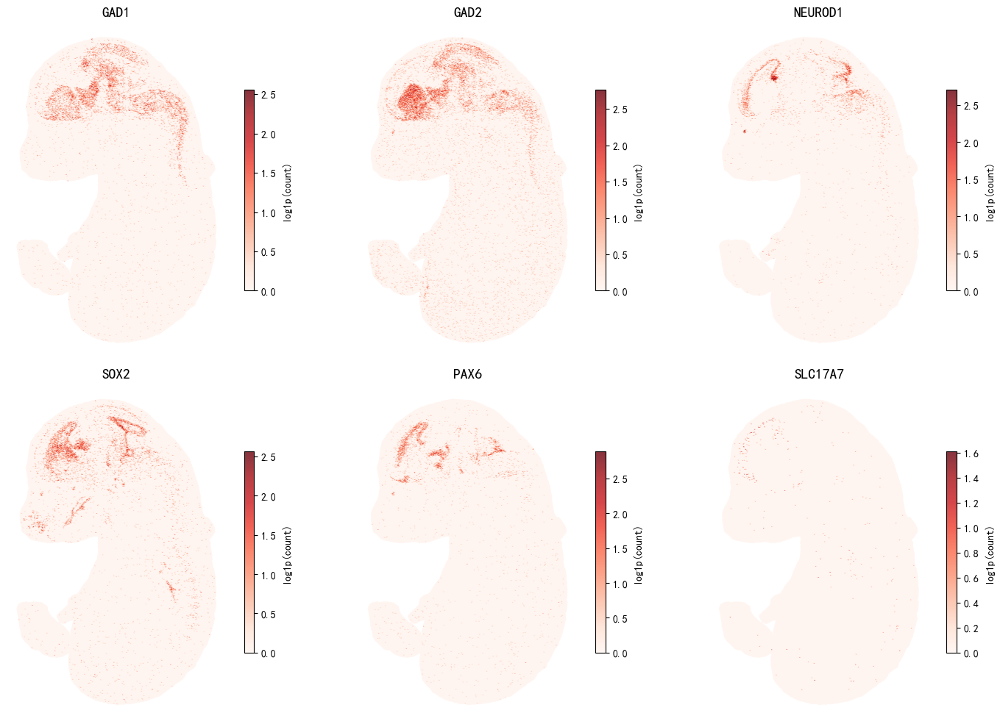


✅ 图片已保存到: C:\Users\13918\Desktop\MR\gene_expression_spatial.png


In [6]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# ============================================================
# 🔧 设置要展示的基因列表（注意：已转换为人类基因名，大写）
# ============================================================
genes_to_plot = ['GAD1', 'GAD2', 'NEUROD1', 'SOX2', 'PAX6', 'SLC17A7']
# ============================================================

# 筛选存在的基因
available_genes = [g for g in genes_to_plot if g in adata.var_names]
missing_genes = [g for g in genes_to_plot if g not in adata.var_names]

if missing_genes:
    print(f"⚠️ 以下基因不在数据中: {missing_genes}")
print(f"✅ 将展示: {available_genes}")

# 获取空间坐标
coords = adata.obsm['spatial']

# 准备表达数据
if 'count' in adata.layers:
    expr_matrix = adata.layers['count']
else:
    expr_matrix = adata.X

# 绘图
n_genes = len(available_genes)
n_cols = min(3, n_genes)
n_rows = (n_genes + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
axes = np.array(axes).flatten() if n_genes > 1 else [axes]

for idx, gene in enumerate(available_genes):
    gene_idx = list(adata.var_names).index(gene)
    expr = expr_matrix[:, gene_idx]
    if hasattr(expr, 'toarray'):
        expr = expr.toarray().flatten()
    
    # log1p 归一化
    expr = np.log1p(expr)
    
    scatter = axes[idx].scatter(
        coords[:, 0], coords[:, 1],
        c=expr, cmap='Reds', s=0.3, alpha=0.8
    )
    axes[idx].set_title(gene, fontsize=14, fontweight='bold')
    axes[idx].set_aspect('equal')
    axes[idx].axis('off')
    plt.colorbar(scatter, ax=axes[idx], shrink=0.6, label='log1p(count)')

# 隐藏多余的子图
for idx in range(len(available_genes), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
save_path = os.path.join(base_dir, 'gene_expression_spatial.png')
plt.savefig(save_path, dpi=200, bbox_inches='tight', facecolor='white')
plt.show()
print(f"\n✅ 图片已保存到: {save_path}")

In [7]:
# 搜索特定基因
def search_genes(adata, keyword):
    matches = [g for g in adata.var_names if keyword.lower() in g.lower()]
    return matches

print("神经相关 (NEURO):", search_genes(adata, 'NEURO')[:10])
print("GAD家族:", search_genes(adata, 'GAD'))
print("SOX家族:", search_genes(adata, 'SOX')[:10])
print("PAX家族:", search_genes(adata, 'PAX'))
print("GABA相关:", search_genes(adata, 'GABA'))
print("谷氨酸相关 (SLC17):", search_genes(adata, 'SLC17'))

神经相关 (NEURO): ['NEUROD2', 'NEUROG2', 'NEUROD6', 'NEUROD1', 'NEUROG1', 'NEUROD4', 'NEUROG3']
GAD家族: ['GADL1', 'GADD45G', 'GADD45GIP1', 'GAD2', 'GADD45A', 'GADD45B', 'ITGAD', 'GAD1']
SOX家族: ['SOX6', 'SOX9', 'SOX5', 'SOX7', 'SOX13', 'SOX12', 'SOX11', 'SOX4', 'QSOX2', 'SOX17']
PAX家族: ['PAXX', 'PAXIP1', 'PAXBP1', 'PAX1', 'PAX7', 'PAX5', 'PAX6', 'PAX9', 'PAX3', 'PAX2', 'PAX8', 'PAX4']
GABA相关: ['GABARAPL2', 'GABARAP', 'GABARAPL1']
谷氨酸相关 (SLC17): ['SLC17A5', 'SLC17A3', 'SLC17A6', 'SLC17A9', 'SLC17A8', 'SLC17A4', 'SLC17A1', 'SLC17A7', 'SLC17A2']


In [8]:
import pandas as pd

# 加载 spatial LDSC 结果
ldsc_path = os.path.join(result_dir, 'spatial_ldsc', 'E16.5_E1S1.MOSTA_IQ.csv.gz')
ldsc_df = pd.read_csv(ldsc_path)
print("Spatial LDSC 结果:")
print(f"列名: {ldsc_df.columns.tolist()}")
print(f"形状: {ldsc_df.shape}")
print(ldsc_df.head())

# 加载 Cauchy 结果
cauchy_path = os.path.join(result_dir, 'cauchy_combination', 'E16.5_E1S1.MOSTA_IQ.Cauchy.csv.gz')
cauchy_df = pd.read_csv(cauchy_path)
print("\nCauchy 组合检验结果 (细胞类型水平):")
print(cauchy_df)

Spatial LDSC 结果:
列名: ['spot', 'beta', 'se', 'z', 'p']
形状: (121767, 5)
      spot          beta            se         z         p
0  190_194 -3.112353e-09  3.201783e-09 -0.972069  0.834492
1  190_195 -4.563149e-09  1.851722e-09 -2.464273  0.993135
2  190_196 -2.778449e-09  1.884672e-09 -1.474235  0.929791
3  190_197 -2.855185e-09  1.847055e-09 -1.545804  0.938924
4  190_198 -4.615922e-09  1.779906e-09 -2.593352  0.995248

Cauchy 组合检验结果 (细胞类型水平):
              annotation      p_cauchy      p_median
0                  Brain  7.300688e-25  8.864658e-15
1            Spinal cord  3.323819e-20  1.325044e-12
2   Dorsal root ganglion  1.596689e-11  1.487320e-08
3         Choroid plexus  8.371748e-11  2.461416e-06
4      Sympathetic nerve  5.772339e-10  4.450782e-07
5     Mucosal epithelium  3.899162e-07  1.107953e-03
6              Inner ear  9.220598e-07  1.680217e-04
7                 Muscle  2.161326e-06  2.335403e-03
8   Cartilage primordium  2.570792e-06  8.013626e-03
9               Menin

In [9]:
列名解释：
- spot: 空间位置标识
- beta: 效应值（该位置的细胞对性状的遗传贡献）
- se: 标准误
- z: z统计量
- p: p值

SyntaxError: invalid character '：' (U+FF1A) (3513464328.py, line 1)

C:\Users\13918\AppData\Local\Temp\ipykernel_79488\921495988.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap('tab20', len(unique_annot))


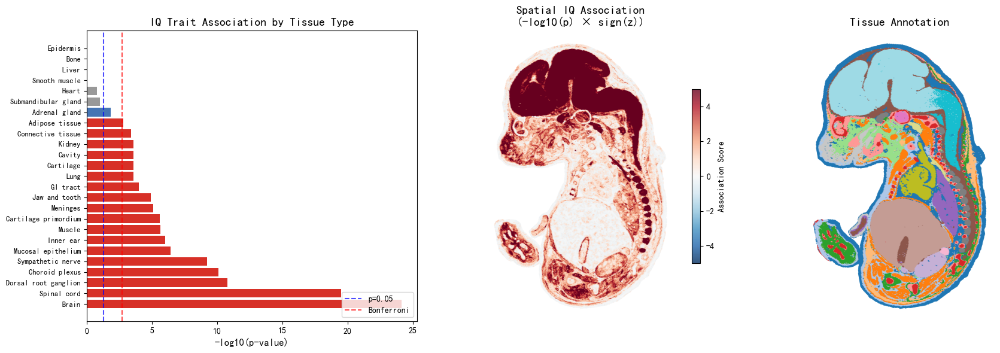


✅ 图片已保存到: C:\Users\13918\Desktop\MR\gsMap_IQ_comprehensive_results.png


In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

base_dir = r'C:\Users\13918\Desktop\MR'
result_dir = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo', 'E16.5_E1S1.MOSTA')

# 设置中文字体
plt.rcParams['font.sans-serif'] = ['SimHei', 'Arial Unicode MS', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# 加载数据
cauchy_df = pd.read_csv(os.path.join(result_dir, 'cauchy_combination', 'E16.5_E1S1.MOSTA_IQ.Cauchy.csv.gz'))
ldsc_df = pd.read_csv(os.path.join(result_dir, 'spatial_ldsc', 'E16.5_E1S1.MOSTA_IQ.csv.gz'))

# 创建图形
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# ===== 图1: 细胞类型关联柱状图 =====
cauchy_sorted = cauchy_df.sort_values('p_cauchy')
colors = ['#d73027' if p < 0.05/25 else '#4575b4' if p < 0.05 else '#999999' 
          for p in cauchy_sorted['p_cauchy']]

y_pos = range(len(cauchy_sorted))
bars = axes[0].barh(y_pos, -np.log10(cauchy_sorted['p_cauchy']), color=colors)
axes[0].set_yticks(y_pos)
axes[0].set_yticklabels(cauchy_sorted['annotation'], fontsize=9)
axes[0].set_xlabel('-log10(p-value)', fontsize=12)
axes[0].set_title('IQ Trait Association by Tissue Type', fontsize=14, fontweight='bold')
axes[0].axvline(x=-np.log10(0.05), color='blue', linestyle='--', alpha=0.7, label='p=0.05')
axes[0].axvline(x=-np.log10(0.05/25), color='red', linestyle='--', alpha=0.7, label='Bonferroni')
axes[0].legend(loc='lower right')

# ===== 图2: 空间关联热图 =====
coords = adata.obsm['spatial']

# 使用 -log10(p) * sign(z) 作为得分
scores = -np.log10(ldsc_df['p'].values + 1e-300) * np.sign(ldsc_df['z'].values)
# 限制极端值
scores = np.clip(scores, -10, 10)

scatter = axes[1].scatter(
    coords[:, 0], coords[:, 1],
    c=scores, cmap='RdBu_r', s=0.3, alpha=0.8,
    vmin=-5, vmax=5
)
axes[1].set_title('Spatial IQ Association\n(-log10(p) × sign(z))', fontsize=14, fontweight='bold')
axes[1].set_aspect('equal')
axes[1].axis('off')
plt.colorbar(scatter, ax=axes[1], shrink=0.6, label='Association Score')

# ===== 图3: 按组织类型着色 =====
# 创建annotation颜色映射
annotations = adata.obs['annotation']
unique_annot = annotations.unique()
color_map = plt.cm.get_cmap('tab20', len(unique_annot))
annot_colors = {annot: color_map(i) for i, annot in enumerate(unique_annot)}
cell_colors = [annot_colors[a] for a in annotations]

axes[2].scatter(coords[:, 0], coords[:, 1], c=cell_colors, s=0.3, alpha=0.8)
axes[2].set_title('Tissue Annotation', fontsize=14, fontweight='bold')
axes[2].set_aspect('equal')
axes[2].axis('off')

plt.tight_layout()
save_path = os.path.join(base_dir, 'gsMap_IQ_comprehensive_results.png')
plt.savefig(save_path, dpi=200, bbox_inches='tight', facecolor='white')
plt.show()
print(f"\n✅ 图片已保存到: {save_path}")

In [11]:
# 筛选显著结果
significant_tissues = cauchy_df[cauchy_df['p_cauchy'] < 0.05].copy()
significant_tissues['neg_log10_p'] = -np.log10(significant_tissues['p_cauchy'])
significant_tissues = significant_tissues.sort_values('p_cauchy')

print("=" * 70)
print("与 IQ 显著相关的组织/细胞类型 (p < 0.05)")
print("=" * 70)
print(f"{'组织类型':<25} {'p_cauchy':<15} {'-log10(p)':<12} {'显著性'}")
print("-" * 70)

for _, row in significant_tissues.iterrows():
    p = row['p_cauchy']
    if p < 0.05/25:
        sig = "*** Bonferroni"
    elif p < 0.001:
        sig = "***"
    elif p < 0.01:
        sig = "**"
    else:
        sig = "*"
    print(f"{row['annotation']:<25} {p:<15.2e} {row['neg_log10_p']:<12.2f} {sig}")

print("=" * 70)
print(f"显著组织数: {len(significant_tissues)}/25")
print(f"Bonferroni校正阈值: {0.05/25:.4f}")

与 IQ 显著相关的组织/细胞类型 (p < 0.05)
组织类型                      p_cauchy        -log10(p)    显著性
----------------------------------------------------------------------
Brain                     7.30e-25        24.14        *** Bonferroni
Spinal cord               3.32e-20        19.48        *** Bonferroni
Dorsal root ganglion      1.60e-11        10.80        *** Bonferroni
Choroid plexus            8.37e-11        10.08        *** Bonferroni
Sympathetic nerve         5.77e-10        9.24         *** Bonferroni
Mucosal epithelium        3.90e-07        6.41         *** Bonferroni
Inner ear                 9.22e-07        6.04         *** Bonferroni
Muscle                    2.16e-06        5.67         *** Bonferroni
Cartilage primordium      2.57e-06        5.59         *** Bonferroni
Meninges                  7.71e-06        5.11         *** Bonferroni
Jaw and tooth             1.22e-05        4.91         *** Bonferroni
GI tract                  1.05e-04        3.98         *** Bonferroni
L

⚠️ 以下基因不在数据中: ['MAPK', 'AKT']
✅ 将展示: ['IL1B', 'SOX2', 'PAX6', 'SLC17A7']


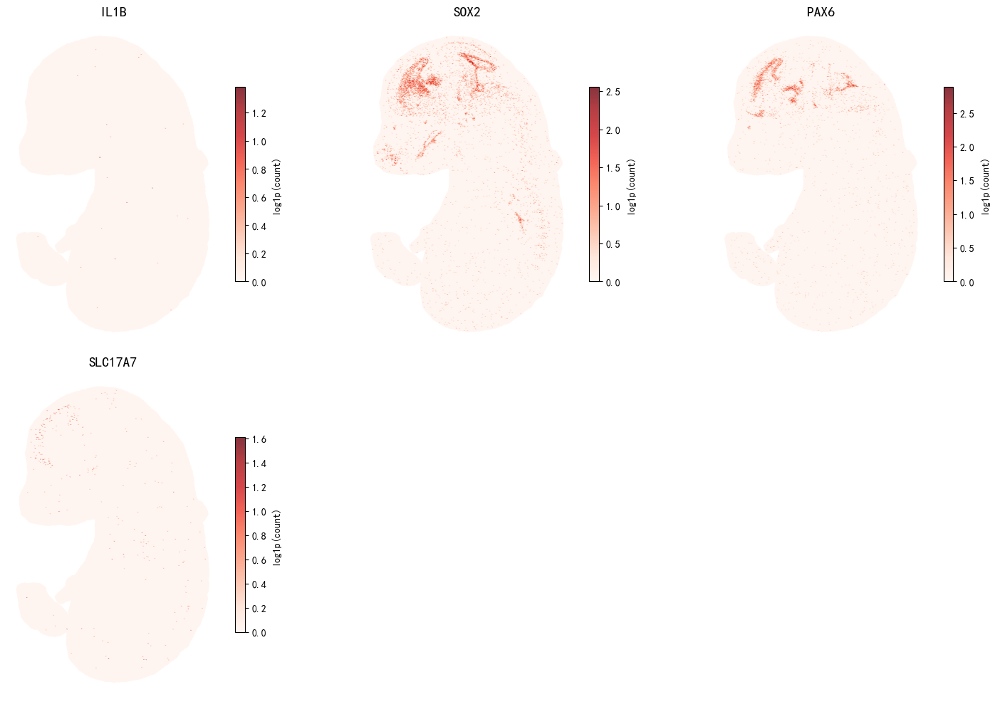


✅ 图片已保存到: C:\Users\13918\Desktop\MR\gene_expression_spatial.png


In [13]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# ============================================================
# 🔧 设置要展示的基因列表（注意：已转换为人类基因名，大写）
# ============================================================
genes_to_plot = ['MAPK', 'AKT', 'IL1B', 'SOX2', 'PAX6', 'SLC17A7']
# ============================================================

# 筛选存在的基因
available_genes = [g for g in genes_to_plot if g in adata.var_names]
missing_genes = [g for g in genes_to_plot if g not in adata.var_names]

if missing_genes:
    print(f"⚠️ 以下基因不在数据中: {missing_genes}")
print(f"✅ 将展示: {available_genes}")

# 获取空间坐标
coords = adata.obsm['spatial']

# 准备表达数据
if 'count' in adata.layers:
    expr_matrix = adata.layers['count']
else:
    expr_matrix = adata.X

# 绘图
n_genes = len(available_genes)
n_cols = min(3, n_genes)
n_rows = (n_genes + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
axes = np.array(axes).flatten() if n_genes > 1 else [axes]

for idx, gene in enumerate(available_genes):
    gene_idx = list(adata.var_names).index(gene)
    expr = expr_matrix[:, gene_idx]
    if hasattr(expr, 'toarray'):
        expr = expr.toarray().flatten()
    
    # log1p 归一化
    expr = np.log1p(expr)
    
    scatter = axes[idx].scatter(
        coords[:, 0], coords[:, 1],
        c=expr, cmap='Reds', s=0.3, alpha=0.8
    )
    axes[idx].set_title(gene, fontsize=14, fontweight='bold')
    axes[idx].set_aspect('equal')
    axes[idx].axis('off')
    plt.colorbar(scatter, ax=axes[idx], shrink=0.6, label='log1p(count)')

# 隐藏多余的子图
for idx in range(len(available_genes), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
save_path = os.path.join(base_dir, 'gene_expression_spatial.png')
plt.savefig(save_path, dpi=200, bbox_inches='tight', facecolor='white')
plt.show()
print(f"\n✅ 图片已保存到: {save_path}")

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# ============================================================
# 🔧 设置要展示的基因列表（注意：已转换为人类基因名，大写）
# ============================================================
genes_to_plot = ['MAPK', 'AKT', 'IL1B', 'SOX2', 'PAX6', 'SLC17A7']
# ============================================================

# 筛选存在的基因
available_genes = [g for g in genes_to_plot if g in adata.var_names]
missing_genes = [g for g in genes_to_plot if g not in adata.var_names]

if missing_genes:
    print(f"⚠️ 以下基因不在数据中: {missing_genes}")
print(f"✅ 将展示: {available_genes}")

# 获取空间坐标
coords = adata.obsm['spatial']

# 准备表达数据
if 'count' in adata.layers:
    expr_matrix = adata.layers['count']
else:
    expr_matrix = adata.X

# 绘图
n_genes = len(available_genes)
n_cols = min(3, n_genes)
n_rows = (n_genes + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
axes = np.array(axes).flatten() if n_genes > 1 else [axes]

for idx, gene in enumerate(available_genes):
    gene_idx = list(adata.var_names).index(gene)
    expr = expr_matrix[:, gene_idx]
    if hasattr(expr, 'toarray'):
        expr = expr.toarray().flatten()
    
    # log1p 归一化
    expr = np.log1p(expr)
    
    scatter = axes[idx].scatter(
        coords[:, 0], coords[:, 1],
        c=expr, cmap='Reds', s=0.3, alpha=0.8
    )
    axes[idx].set_title(gene, fontsize=14, fontweight='bold')
    axes[idx].set_aspect('equal')
    axes[idx].axis('off')
    plt.colorbar(scatter, ax=axes[idx], shrink=0.6, label='log1p(count)')

# 隐藏多余的子图
for idx in range(len(available_genes), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
save_path = os.path.join(base_dir, 'gene_expression_spatial.png')
plt.savefig(save_path, dpi=200, bbox_inches='tight', facecolor='white')
plt.show()
print(f"\n✅ 图片已保存到: {save_path}")

In [2]:
import gzip
import shutil
import os

input_path = r"C:\Users\13918\Desktop\MR\gsMap_example_data\GWAS\HannumAA.sumstats"
output_path = r"C:\Users\13918\Desktop\MR\gsMap_example_data\GWAS\HannumAA.sumstats.gz"

# 直接压缩
with open(input_path, 'rb') as f_in:
    with gzip.open(output_path, 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)

print(f"压缩完成！")
print(f"原文件大小: {os.path.getsize(input_path) / 1024 / 1024:.2f} MB")
print(f"压缩后大小: {os.path.getsize(output_path) / 1024 / 1024:.2f} MB")

压缩完成！
原文件大小: 201.55 MB
压缩后大小: 53.68 MB


In [ ]:
import subprocess
import sys
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# 定义所有路径
workdir = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo')
homolog_file = os.path.join(base_dir, 'gsMap_resource', 'homologs', 'mouse_human_homologs.txt')
resource_dir = os.path.join(base_dir, 'gsMap_resource')
hdf5_path = os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad')
sumstats_file = os.path.join(base_dir, 'gsMap_example_data', 'GWAS', 'HannumAA.sumstats.gz')  # ✅ 修改这里

# 构建命令
cmd = [
    sys.executable, '-m', 'gsMap', 'quick_mode',
    '--workdir', workdir,
    '--homolog_file', homolog_file,
    '--sample_name', 'E16.5_E1S1.MOSTA',
    '--gsMap_resource_dir', resource_dir,
    '--hdf5_path', hdf5_path,
    '--annotation', 'annotation',
    '--data_layer', 'count',
    '--sumstats_file', sumstats_file,
    '--trait_name', 'HannumAA'  # ✅ 修改这里
]

print("=" * 60)
print("开始 gsMap Quick Mode 分析")
print("=" * 60)
print(f"样本: E16.5_E1S1.MOSTA (121,767 细胞)")
print(f"性状: HannumAA")
print(f"输出目录: {workdir}")
print("=" * 60)
print("\n⏳ 分析可能需要较长时间，请耐心等待...\n")

# 运行
process = subprocess.Popen(
    cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    bufsize=1
)

for line in process.stdout:
    print(line, end='')

return_code = process.wait()

print("\n" + "=" * 60)
if return_code == 0:
    print("✅ gsMap 分析完成！")
else:
    print(f"❌ gsMap 分析失败，返回码: {return_code}")
print("=" * 60)

开始 gsMap Quick Mode 分析
样本: E16.5_E1S1.MOSTA (121,767 细胞)
性状: HannumAA
输出目录: C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo

⏳ 分析可能需要较长时间，请耐心等待...

                                   ___  ___            
                                   |  \/  |            
                          __ _ ___ | .  . | __ _ _ __  
                         / _` / __|| |\/| |/ _` | '_ \ 
                        | (_| \__ \| |  | | (_| | |_) |
                         \__, |___/\_|  |_/\__,_| .__/ 
                          __/ |                 | |    
                         |___/                  |_|
                                Version: 1.73.7                                 
[2026-03-03 10:40:04,199] INFO | gsMap - Running quick_mode...
[2026-03-03 10:40:04,199] INFO | gsMap - Started at: 2026-03-03 10:40:04
Using the following arguments for RunAllModeConfig:
{   'annotation': 'annotation',
    'data_layer': 'count',
    'gM_slices': None,
    'gsMap_resource_dir': 'C:\\Users\\13918\\De

In [1]:
import os

# 查看输出目录结构
workdir = r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo'

for root, dirs, files in os.walk(workdir):
    # 只显示HannumAA相关的文件
    for file in files:
        if 'HannumAA' in file:
            full_path = os.path.join(root, file)
            size = os.path.getsize(full_path) / 1024
            print(f"{full_path}  ({size:.1f} KB)")

C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\cauchy_combination\E16.5_E1S1.MOSTA_HannumAA.Cauchy.csv.gz  (0.8 KB)
C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\report\HannumAA\gsMap_plot\E16.5_E1S1.MOSTA_HannumAA_gsMap_plot.html  (11175.2 KB)
C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\spatial_ldsc\E16.5_E1S1.MOSTA_HannumAA.csv.gz  (4713.9 KB)


In [2]:
import pandas as pd

# 读取Cauchy组合结果（细胞类型层面）
cauchy_path = r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\cauchy_combination\E16.5_E1S1.MOSTA_HannumAA.Cauchy.csv.gz'
cauchy_df = pd.read_csv(cauchy_path, compression='gzip')
print("=== Cauchy组合结果（细胞类型层面）===")
print(cauchy_df.shape)
print(cauchy_df.head(10))
print(cauchy_df.columns.tolist())

=== Cauchy组合结果（细胞类型层面）===
(25, 3)
            annotation  p_cauchy  p_median
0        Smooth muscle  0.068133  0.147373
1                 Lung  0.074922  0.160726
2       Choroid plexus  0.084477  0.214384
3                Liver  0.102399  0.252130
4             GI tract  0.117781  0.244114
5               Kidney  0.129618  0.252230
6            Epidermis  0.161032  0.351052
7            Cartilage  0.210491  0.501149
8  Submandibular gland  0.382740  0.479100
9   Mucosal epithelium  0.451255  0.444725
['annotation', 'p_cauchy', 'p_median']


In [3]:
# 读取空间LDSC结果（细胞层面）
spatial_path = r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\spatial_ldsc\E16.5_E1S1.MOSTA_HannumAA.csv.gz'
spatial_df = pd.read_csv(spatial_path, compression='gzip')
print("=== 空间LDSC结果（细胞层面）===")
print(spatial_df.shape)
print(spatial_df.head(10))
print(spatial_df.columns.tolist())

=== 空间LDSC结果（细胞层面）===
(121767, 5)
      spot          beta            se         z         p
0  190_194 -1.460794e-08  9.934464e-09 -1.470431  0.929277
1  190_195 -5.018417e-09  5.157631e-09 -0.973008  0.834725
2  190_196 -5.957574e-09  4.767880e-09 -1.249523  0.894263
3  190_197 -3.816327e-09  4.596616e-09 -0.830247  0.796800
4  190_198 -4.517857e-09  4.840953e-09 -0.933258  0.824657
5  190_199 -2.911138e-09  5.240660e-09 -0.555491  0.710720
6  190_200 -2.911138e-09  5.240660e-09 -0.555491  0.710720
7  190_201 -3.290094e-09  4.815859e-09 -0.683179  0.752753
8  190_202 -5.758246e-09  5.179427e-09 -1.111753  0.866878
9  190_203 -8.430041e-09  5.491286e-09 -1.535167  0.937629
['spot', 'beta', 'se', 'z', 'p']


In [4]:
import scanpy as sc
import pandas as pd
import numpy as np

# 读取h5ad文件获取基因表达和空间坐标
hdf5_path = r"C:\Users\13918\Desktop\MR\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad"
adata = sc.read_h5ad(hdf5_path)

print("=== h5ad文件基本信息 ===")
print(adata)
print(f"\n细胞数: {adata.n_obs}")
print(f"基因数: {adata.n_vars}")
print(f"\n观测值(obs)列名: {adata.obs.columns.tolist()}")
print(f"\n是否有空间坐标: {'spatial' in adata.obsm}")
print(f"\nobsm keys: {list(adata.obsm.keys())}")
print(f"\n基因名前10个: {adata.var_names[:10].tolist()}")

=== h5ad文件基本信息 ===
AnnData object with n_obs × n_vars = 121767 × 28204
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - AI987944', 'Regulon - Alx1', 'Regulon - Alx4', 'Regulon - Arid3a', 'Regulon - Arnt2', 'Regulon - Arx', 'Regulon - Atf1', 'Regulon - Atf2', 'Regulon - Atf3', 'Regulon - Atf4', 'Regulon - Atf6', 'Regulon - Atoh1', 'Regulon - Bach2', 'Regulon - Barhl1', 'Regulon - Barhl2', 'Regulon - Barx1', 'Regulon - Bcl6', 'Regulon - Bclaf1', 'Regulon - Bdp1', 'Regulon - Bhlhe40', 'Regulon - Bmyc', 'Regulon - Brca1', 'Regulon - Brf1', 'Regulon - Brf2', 'Regulon - Cdx1', 'Regulon - Cdx2', 'Regulon - Cebpa', 'Regulon - Cebpb', 'Regulon - Cebpe', 'Regulon - Cic', 'Regulon - Clock', 'Regulon - Creb1', 'Regulon - Creb3l1', 'Regulon - Creb3l2', 'Regulon - Creb5', 'Regulon - Crebl2', 'Regulon - Ctcf', 'Regulon - Ctcfl', 'Regulon - Cux1', 'Regulon - Dbp', 'Regulon - Dbx1', 'Regulon - Ddit3', 'Regulon - Dlx1', 'Regulon - Dl

In [5]:
import pandas as pd
import numpy as np

# 目标人类基因列表
human_genes = ['NHLRC1', 'TPMT', 'SELP', 'RIPPLY3', 'ZNF373A', 'PLDN', 'EDARADD']

# 读取同源基因文件
homolog_path = r'C:\Users\13918\Desktop\MR\gsMap_resource\homologs\mouse_human_homologs.txt'
homolog_df = pd.read_csv(homolog_path, sep='\t')

print("同源基因文件列名：")
print(homolog_df.columns.tolist())
print("\n前5行：")
print(homolog_df.head())

同源基因文件列名：
['MOUSE_GENE_SYM', 'HUMAN_GENE_SYM']

前5行：
  MOUSE_GENE_SYM HUMAN_GENE_SYM
0          Hsfy2          HSFY1
1         Gm5788         EIF1AY
2        Gm21677         RBMY1B
3          Tbl1x          TBL1Y
4        Pcdh11x        PCDH11Y


In [6]:
# 查找目标基因的小鼠同源基因
print("\n=== 目标基因同源基因查找结果 ===")
for gene in human_genes:
    # 尝试匹配（不区分大小写）
    match = homolog_df[homolog_df.apply(lambda x: x.astype(str).str.upper()).eq(gene).any(axis=1)]
    if len(match) > 0:
        print(f"✅ {gene} -> {match.values}")
    else:
        print(f"❌ {gene} -> 未找到同源基因")


=== 目标基因同源基因查找结果 ===
✅ NHLRC1 -> [['Nhlrc1' 'NHLRC1']]
✅ TPMT -> [['Tpmt' 'TPMT']]
✅ SELP -> [['Selp' 'SELP']]
✅ RIPPLY3 -> [['Ripply3' 'RIPPLY3']]
❌ ZNF373A -> 未找到同源基因
❌ PLDN -> 未找到同源基因
✅ EDARADD -> [['Edaradd' 'EDARADD']]


In [7]:
# 同时检查这些基因是否直接存在于h5ad中（小写或首字母大写形式）
print("\n=== 直接检查h5ad基因列表 ===")
gene_list = adata.var_names.tolist()

for gene in human_genes:
    # 检查多种大小写形式
    forms = [gene, gene.capitalize(), gene.lower(), 
             gene[0].upper() + gene[1:].lower()]
    found = [f for f in forms if f in gene_list]
    if found:
        print(f"✅ {gene} -> 在h5ad中找到: {found}")
    else:
        print(f"❌ {gene} -> 不在h5ad基因列表中")


=== 直接检查h5ad基因列表 ===
✅ NHLRC1 -> 在h5ad中找到: ['Nhlrc1', 'Nhlrc1']
✅ TPMT -> 在h5ad中找到: ['Tpmt', 'Tpmt']
✅ SELP -> 在h5ad中找到: ['Selp', 'Selp']
✅ RIPPLY3 -> 在h5ad中找到: ['Ripply3', 'Ripply3']
❌ ZNF373A -> 不在h5ad基因列表中
❌ PLDN -> 不在h5ad基因列表中
✅ EDARADD -> 在h5ad中找到: ['Edaradd', 'Edaradd']


In [8]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import scanpy as sc
from scipy.sparse import issparse
import os

# ========== 设置输出目录 ==========
output_dir = r'C:\Users\13918\Desktop\MR\HannumAA_results'
os.makedirs(output_dir, exist_ok=True)

# ========== 1. 整合数据 ==========
print("=" * 60)
print("1. 整合数据...")
print("=" * 60)

# 读取数据
hdf5_path = r"C:\Users\13918\Desktop\MR\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad"
adata = sc.read_h5ad(hdf5_path)

spatial_path = r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\spatial_ldsc\E16.5_E1S1.MOSTA_HannumAA.csv.gz'
spatial_df = pd.read_csv(spatial_path, compression='gzip')

cauchy_path = r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\cauchy_combination\E16.5_E1S1.MOSTA_HannumAA.Cauchy.csv.gz'
cauchy_df = pd.read_csv(cauchy_path, compression='gzip')

# 获取空间坐标
spatial_coords = adata.obsm['spatial']
cell_ids = adata.obs_names.tolist()

# 构建基础dataframe
meta_df = pd.DataFrame({
    'spot': cell_ids,
    'x': spatial_coords[:, 0],
    'y': spatial_coords[:, 1],
    'annotation': adata.obs['annotation'].values
})

# 合并spatial_ldsc结果
spatial_df['spot'] = spatial_df['spot'].astype(str)
meta_df['spot'] = meta_df['spot'].astype(str)
merged_df = meta_df.merge(spatial_df, on='spot', how='left')

# 计算-log10(p)
merged_df['neg_log10_p'] = -np.log10(merged_df['p'].clip(1e-300))

# 提取目标基因表达量
target_genes_mouse = ['Nhlrc1', 'Tpmt', 'Selp', 'Ripply3', 'Edaradd']
target_genes_human = ['NHLRC1', 'TPMT', 'SELP', 'RIPPLY3', 'EDARADD']

for mouse_gene, human_gene in zip(target_genes_mouse, target_genes_human):
    gene_idx = adata.var_names.get_loc(mouse_gene)
    expr = adata.layers['count'][:, gene_idx]
    if issparse(expr):
        expr = expr.toarray().flatten()
    else:
        expr = np.array(expr).flatten()
    merged_df[f'expr_{human_gene}'] = expr

print(f"数据整合完成！共 {merged_df.shape[0]} 个细胞")

# ========== 2. 生成文章报道用的表格 ==========
print("\n" + "=" * 60)
print("2. 生成结果表格...")
print("=" * 60)

# 表1：细胞类型关联结果
cauchy_df_sorted = cauchy_df.sort_values('p_cauchy').copy()
cauchy_df_sorted['FDR'] = cauchy_df_sorted['p_cauchy'].rank() / len(cauchy_df_sorted) * cauchy_df_sorted['p_cauchy']
cauchy_df_sorted['Significant'] = cauchy_df_sorted['p_cauchy'] < 0.05
cauchy_df_sorted.to_csv(os.path.join(output_dir, 'Table1_CellType_Association.csv'), index=False)
print("\n📊 Table 1: 细胞类型与HannumAA关联结果")
print(cauchy_df_sorted.to_string(index=False))

# 表2：目标基因在各细胞类型中的表达统计
print("\n📊 Table 2: 目标基因表达统计")
gene_stats = []
for human_gene in target_genes_human:
    col = f'expr_{human_gene}'
    for ct in merged_df['annotation'].unique():
        ct_data = merged_df[merged_df['annotation'] == ct][col]
        gene_stats.append({
            'Gene': human_gene,
            'CellType': ct,
            'Mean_Expression': ct_data.mean(),
            'Pct_Expressed': (ct_data > 0).mean() * 100,
            'Max_Expression': ct_data.max()
        })
gene_stats_df = pd.DataFrame(gene_stats)
gene_stats_df.to_csv(os.path.join(output_dir, 'Table2_Gene_Expression_Stats.csv'), index=False)
print(gene_stats_df.head(15).to_string(index=False))

# 表3：空间LDSC结果汇总（按细胞类型）
spatial_summary = merged_df.groupby('annotation').agg({
    'beta': 'mean',
    'z': 'mean',
    'p': 'median',
    'neg_log10_p': 'mean'
}).reset_index()
spatial_summary.columns = ['CellType', 'Mean_Beta', 'Mean_Z', 'Median_P', 'Mean_negLog10P']
spatial_summary = spatial_summary.sort_values('Mean_negLog10P', ascending=False)
spatial_summary.to_csv(os.path.join(output_dir, 'Table3_Spatial_LDSC_Summary.csv'), index=False)
print("\n📊 Table 3: 空间LDSC结果汇总")
print(spatial_summary.to_string(index=False))

# ========== 3. 绑图 ==========
print("\n" + "=" * 60)
print("3. 绑制图片...")
print("=" * 60)

# 设置绑图风格
plt.rcParams['font.size'] = 10
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'DejaVu Sans'

# ---------- 图1：空间分布图 - LDSC P值 ----------
fig, ax = plt.subplots(figsize=(12, 10))
scatter = ax.scatter(merged_df['x'], merged_df['y'], 
                     c=merged_df['neg_log10_p'], 
                     cmap='RdYlBu_r', 
                     s=0.5, alpha=0.8)
plt.colorbar(scatter, ax=ax, label='-log10(P-value)', shrink=0.6)
ax.set_title('Spatial Distribution of HannumAA Association\n(-log10 P-value)', fontsize=14)
ax.set_xlabel('Spatial X')
ax.set_ylabel('Spatial Y')
ax.set_aspect('equal')
ax.invert_yaxis()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Fig1_Spatial_LDSC_Pvalue.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(output_dir, 'Fig1_Spatial_LDSC_Pvalue.pdf'), bbox_inches='tight')
plt.close()
print("✅ Fig1: 空间LDSC P值分布图 - 完成")

# ---------- 图2：空间分布图 - 细胞类型注释 ----------
fig, ax = plt.subplots(figsize=(14, 10))
cell_types = merged_df['annotation'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(cell_types)))
color_dict = dict(zip(cell_types, colors))

for ct in cell_types:
    ct_data = merged_df[merged_df['annotation'] == ct]
    ax.scatter(ct_data['x'], ct_data['y'], c=[color_dict[ct]], s=0.5, label=ct, alpha=0.7)

ax.set_title('Spatial Distribution by Cell Type', fontsize=14)
ax.set_xlabel('Spatial X')
ax.set_ylabel('Spatial Y')
ax.set_aspect('equal')
ax.invert_yaxis()
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', markerscale=5, fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Fig2_Spatial_CellType.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(output_dir, 'Fig2_Spatial_CellType.pdf'), bbox_inches='tight')
plt.close()
print("✅ Fig2: 细胞类型空间分布图 - 完成")

# ---------- 图3：细胞类型关联柱状图 ----------
fig, ax = plt.subplots(figsize=(10, 8))
cauchy_sorted = cauchy_df.sort_values('p_cauchy')
colors = ['#E74C3C' if p < 0.05 else '#3498DB' for p in cauchy_sorted['p_cauchy']]

bars = ax.barh(range(len(cauchy_sorted)), -np.log10(cauchy_sorted['p_cauchy']), color=colors)
ax.set_yticks(range(len(cauchy_sorted)))
ax.set_yticklabels(cauchy_sorted['annotation'])
ax.axvline(x=-np.log10(0.05), color='red', linestyle='--', label='P = 0.05')
ax.set_xlabel('-log10(P-value)')
ax.set_title('Cell Type Association with HannumAA\n(Cauchy Combination Test)', fontsize=14)
ax.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Fig3_CellType_Association_Bar.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(output_dir, 'Fig3_CellType_Association_Bar.pdf'), bbox_inches='tight')
plt.close()
print("✅ Fig3: 细胞类型关联柱状图 - 完成")

# ---------- 图4：目标基因空间表达图 ----------
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, human_gene in enumerate(target_genes_human):
    ax = axes[i]
    col = f'expr_{human_gene}'
    expr_values = merged_df[col]
    
    scatter = ax.scatter(merged_df['x'], merged_df['y'], 
                        c=expr_values, cmap='Reds', s=0.5, alpha=0.8,
                        vmin=0, vmax=np.percentile(expr_values[expr_values > 0], 95) if (expr_values > 0).any() else 1)
    plt.colorbar(scatter, ax=ax, label='Expression', shrink=0.6)
    ax.set_title(f'{human_gene} Expression', fontsize=12)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')

# 隐藏空余子图
axes[5].axis('off')
plt.suptitle('Spatial Expression of Target Genes', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Fig4_Target_Genes_Spatial_Expression.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(output_dir, 'Fig4_Target_Genes_Spatial_Expression.pdf'), bbox_inches='tight')
plt.close()
print("✅ Fig4: 目标基因空间表达图 - 完成")

# ---------- 图5：每个目标基因单独的空间表达图 ----------
for human_gene in target_genes_human:
    fig, ax = plt.subplots(figsize=(12, 10))
    col = f'expr_{human_gene}'
    expr_values = merged_df[col]
    
    scatter = ax.scatter(merged_df['x'], merged_df['y'], 
                        c=expr_values, cmap='Reds', s=0.5, alpha=0.8,
                        vmin=0, vmax=np.percentile(expr_values[expr_values > 0], 95) if (expr_values > 0).any() else 1)
    plt.colorbar(scatter, ax=ax, label='Expression', shrink=0.6)
    ax.set_title(f'Spatial Expression of {human_gene}', fontsize=14)
    ax.set_aspect('equal')
    ax.invert_yaxis()
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'Fig5_{human_gene}_Spatial_Expression.png'), dpi=300, bbox_inches='tight')
    plt.savefig(os.path.join(output_dir, f'Fig5_{human_gene}_Spatial_Expression.pdf'), bbox_inches='tight')
    plt.close()
print("✅ Fig5: 每个目标基因单独空间图 - 完成")

# ---------- 图6：目标基因在各细胞类型的表达热图 ----------
heatmap_data = gene_stats_df.pivot(index='CellType', columns='Gene', values='Mean_Expression')

fig, ax = plt.subplots(figsize=(10, 12))
im = ax.imshow(heatmap_data.values, cmap='YlOrRd', aspect='auto')
plt.colorbar(im, ax=ax, label='Mean Expression', shrink=0.6)

ax.set_xticks(range(len(heatmap_data.columns)))
ax.set_xticklabels(heatmap_data.columns, rotation=45, ha='right')
ax.set_yticks(range(len(heatmap_data.index)))
ax.set_yticklabels(heatmap_data.index)
ax.set_title('Target Gene Expression Across Cell Types', fontsize=14)
ax.set_xlabel('Gene')
ax.set_ylabel('Cell Type')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Fig6_Gene_CellType_Heatmap.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(output_dir, 'Fig6_Gene_CellType_Heatmap.pdf'), bbox_inches='tight')
plt.close()
print("✅ Fig6: 基因-细胞类型表达热图 - 完成")

# ---------- 图7：Top显著细胞类型的空间高亮图 ----------
top_celltypes = cauchy_df.nsmallest(5, 'p_cauchy')['annotation'].tolist()

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, ct in enumerate(top_celltypes):
    ax = axes[i]
    # 背景灰色，目标细胞类型高亮
    other_data = merged_df[merged_df['annotation'] != ct]
    ct_data = merged_df[merged_df['annotation'] == ct]
    
    ax.scatter(other_data['x'], other_data['y'], c='lightgray', s=0.3, alpha=0.3)
    scatter = ax.scatter(ct_data['x'], ct_data['y'], 
                        c=ct_data['neg_log10_p'], cmap='Reds', s=0.8, alpha=0.9)
    plt.colorbar(scatter, ax=ax, label='-log10(P)', shrink=0.6)
    
    pval = cauchy_df[cauchy_df['annotation'] == ct]['p_cauchy'].values[0]
    ax.set_title(f'{ct}\n(P = {pval:.4f})', fontsize=11)
    ax.set_aspect('equal')
    ax.invert_yaxis()

axes[5].axis('off')
plt.suptitle('Top 5 Associated Cell Types Spatial Distribution', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Fig7_Top_CellTypes_Spatial.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(output_dir, 'Fig7_Top_CellTypes_Spatial.pdf'), bbox_inches='tight')
plt.close()
print("✅ Fig7: Top关联细胞类型空间图 - 完成")

# ---------- 图8：散点图 - Z值 vs Beta ----------
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(merged_df['beta'], merged_df['z'], 
                    c=merged_df['neg_log10_p'], cmap='viridis', s=0.5, alpha=0.5)
plt.colorbar(scatter, ax=ax, label='-log10(P)')
ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
ax.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
ax.set_xlabel('Beta (Effect Size)')
ax.set_ylabel('Z-score')
ax.set_title('Spatial LDSC: Beta vs Z-score', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'Fig8_Beta_vs_Z.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(output_dir, 'Fig8_Beta_vs_Z.pdf'), bbox_inches='tight')
plt.close()
print("✅ Fig8: Beta vs Z散点图 - 完成")

# ========== 4. 汇总报告 ==========
print("\n" + "=" * 60)
print("4. 生成文章报道摘要...")
print("=" * 60)

summary_text = f"""
==================== HannumAA gsMap 分析报告 ====================

📊 数据概况:
- 样本: E16.5_E1S1.MOSTA (小鼠胚胎E16.5)
- 细胞总数: {merged_df.shape[0]:,}
- 细胞类型数: {merged_df['annotation'].nunique()}
- 分析性状: HannumAA (Hannum Age Acceleration)
- GWAS样本量: N = 34,449

📈 细胞类型关联结果 (Cauchy Combination Test):
{cauchy_df_sorted[['annotation', 'p_cauchy']].head(10).to_string(index=False)}

🔬 最显著关联的细胞类型:
{', '.join(cauchy_df_sorted[cauchy_df_sorted['p_cauchy'] < 0.1]['annotation'].tolist())}

🧬 目标基因分析 (5个有小鼠同源基因):
- NHLRC1 (Nhlrc1): 平均表达 {merged_df['expr_NHLRC1'].mean():.4f}
- TPMT (Tpmt): 平均表达 {merged_df['expr_TPMT'].mean():.4f}
- SELP (Selp): 平均表达 {merged_df['expr_SELP'].mean():.4f}
- RIPPLY3 (Ripply3): 平均表达 {merged_df['expr_RIPPLY3'].mean():.4f}
- EDARADD (Edaradd): 平均表达 {merged_df['expr_EDARADD'].mean():.4f}

❌ 未找到小鼠同源基因: ZNF373A, PLDN

📁 输出文件:
- Table1_CellType_Association.csv: 细胞类型关联结果
- Table2_Gene_Expression_Stats.csv: 目标基因表达统计
- Table3_Spatial_LDSC_Summary.csv: 空间LDSC汇总
- Fig1: 空间LDSC P值分布图
- Fig2: 细胞类型空间分布图
- Fig3: 细胞类型关联柱状图
- Fig4: 目标基因空间表达总图
- Fig5: 每个目标基因单独空间图
- Fig6: 基因-细胞类型表达热图
- Fig7: Top关联细胞类型空间图
- Fig8: Beta vs Z散点图

=================================================================
"""

print(summary_text)

# 保存报告
with open(os.path.join(output_dir, 'Analysis_Summary.txt'), 'w', encoding='utf-8') as f:
    f.write(summary_text)

print(f"\n✅ 所有结果已保存至: {output_dir}")
print("=" * 60)

1. 整合数据...
数据整合完成！共 121767 个细胞

2. 生成结果表格...

📊 Table 1: 细胞类型与HannumAA关联结果
          annotation  p_cauchy  p_median      FDR  Significant
       Smooth muscle  0.068133  0.147373 0.002725        False
                Lung  0.074922  0.160726 0.005994        False
      Choroid plexus  0.084477  0.214384 0.010137        False
               Liver  0.102399  0.252130 0.016384        False
            GI tract  0.117781  0.244114 0.023556        False
              Kidney  0.129618  0.252230 0.031108        False
           Epidermis  0.161032  0.351052 0.045089        False
           Cartilage  0.210491  0.501149 0.067357        False
 Submandibular gland  0.382740  0.479100 0.137786        False
  Mucosal epithelium  0.451255  0.444725 0.180502        False
              Muscle  0.568345  0.480361 0.250072        False
   Sympathetic nerve  0.596898  0.530758 0.286511        False
           Inner ear  0.638371  0.583432 0.331953        False
       Adrenal gland  0.706919  0.656478 0.

C:\Users\13918\AppData\Local\Temp\ipykernel_133260\3802751661.py:95: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  spatial_summary = merged_df.groupby('annotation').agg({


✅ Fig1: 空间LDSC P值分布图 - 完成
✅ Fig2: 细胞类型空间分布图 - 完成
✅ Fig3: 细胞类型关联柱状图 - 完成
✅ Fig4: 目标基因空间表达图 - 完成
✅ Fig5: 每个目标基因单独空间图 - 完成
✅ Fig6: 基因-细胞类型表达热图 - 完成
✅ Fig7: Top关联细胞类型空间图 - 完成
✅ Fig8: Beta vs Z散点图 - 完成

4. 生成文章报道摘要...

==================== HannumAA gsMap 分析报告 ====================

📊 数据概况:
- 样本: E16.5_E1S1.MOSTA (小鼠胚胎E16.5)
- 细胞总数: 121,767
- 细胞类型数: 25
- 分析性状: HannumAA (Hannum Age Acceleration)
- GWAS样本量: N = 34,449

📈 细胞类型关联结果 (Cauchy Combination Test):
         annotation  p_cauchy
      Smooth muscle  0.068133
               Lung  0.074922
     Choroid plexus  0.084477
              Liver  0.102399
           GI tract  0.117781
             Kidney  0.129618
          Epidermis  0.161032
          Cartilage  0.210491
Submandibular gland  0.382740
 Mucosal epithelium  0.451255

🔬 最显著关联的细胞类型:
Smooth muscle, Lung, Choroid plexus

🧬 目标基因分析 (5个有小鼠同源基因):
- NHLRC1 (Nhlrc1): 平均表达 0.0182
- TPMT (Tpmt): 平均表达 0.0433
- SELP (Selp): 平均表达 0.0008
- RIPPLY3 (Ripply3): 平均表达 0.0129
- EDARADD (Edaradd): 平均表达 

In [ ]:
import subprocess
import sys
import os

base_dir = r'C:\Users\13918\Desktop\MR'

# 定义所有路径
workdir = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo')
homolog_file = os.path.join(base_dir, 'gsMap_resource', 'homologs', 'mouse_human_homologs.txt')
resource_dir = os.path.join(base_dir, 'gsMap_resource')
hdf5_path = os.path.join(base_dir, 'gsMap_example_data', 'ST', 'E16.5_E1S1.MOSTA.h5ad')
sumstats_file = os.path.join(base_dir, 'gsMap_example_data', 'GWAS', 'AD.sumstats.gz')  # ✅ 修改这里

# 构建命令
cmd = [
    sys.executable, '-m', 'gsMap', 'quick_mode',
    '--workdir', workdir,
    '--homolog_file', homolog_file,
    '--sample_name', 'E16.5_E1S1.MOSTA',
    '--gsMap_resource_dir', resource_dir,
    '--hdf5_path', hdf5_path,
    '--annotation', 'annotation',
    '--data_layer', 'count',
    '--sumstats_file', sumstats_file,
    '--trait_name', 'AD'  # ✅ 修改这里
]

print("=" * 60)
print("开始 gsMap Quick Mode 分析")
print("=" * 60)
print(f"样本: E16.5_E1S1.MOSTA (121,767 细胞)")
print(f"性状: HannumAA")
print(f"输出目录: {workdir}")
print("=" * 60)
print("\n⏳ 分析可能需要较长时间，请耐心等待...\n")

# 运行
process = subprocess.Popen(
    cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    bufsize=1
)

for line in process.stdout:
    print(line, end='')

return_code = process.wait()

print("\n" + "=" * 60)
if return_code == 0:
    print("✅ gsMap 分析完成！")
else:
    print(f"❌ gsMap 分析失败，返回码: {return_code}")
print("=" * 60)

开始 gsMap Quick Mode 分析
样本: E16.5_E1S1.MOSTA (121,767 细胞)
性状: HannumAA
输出目录: C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo

⏳ 分析可能需要较长时间，请耐心等待...

                                   ___  ___            
                                   |  \/  |            
                          __ _ ___ | .  . | __ _ _ __  
                         / _` / __|| |\/| |/ _` | '_ \ 
                        | (_| \__ \| |  | | (_| | |_) |
                         \__, |___/\_|  |_/\__,_| .__/ 
                          __/ |                 | |    
                         |___/                  |_|
                                Version: 1.73.7                                 
[2026-03-08 09:08:40,161] INFO | gsMap - Running quick_mode...
[2026-03-08 09:08:40,161] INFO | gsMap - Started at: 2026-03-08 09:08:40
Using the following arguments for RunAllModeConfig:
{   'annotation': 'annotation',
    'data_layer': 'count',
    'gM_slices': None,
    'gsMap_resource_dir': 'C:\\Users\\13918\\De

In [2]:
import os

workdir_root = r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo'

for root, dirs, files in os.walk(workdir_root):
    level = root.replace(workdir_root, '').count(os.sep)
    indent = '  ' * level
    print(f'{indent}{os.path.basename(root)}/')
    for f in files:
        print(f'{indent}  {f}')

Mouse_Embryo/
  E16.5_E1S1.MOSTA/
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260228_100806.log
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260228_112755.log
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260228_113759.log
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260228_120529.log
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260228_141210.log
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260228_145609.log
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260303_103519.log
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260303_104019.log
    gsMap_pipeline_E16.5_E1S1.MOSTA_20260308_090853.log
    cauchy_combination/
      E16.5_E1S1.MOSTA_AD.Cauchy.csv.gz
      E16.5_E1S1.MOSTA_HannumAA.Cauchy.csv.gz
      E16.5_E1S1.MOSTA_IQ.Cauchy.csv.gz
    find_latent_representations/
      E16.5_E1S1.MOSTA_add_latent.h5ad
    generate_ldscore/
      E16.5_E1S1.MOSTA_generate_ldscore.done
      baseline/
        baseline.1.l2.ldscore.feather
        baseline.1.l2.M
        baseline.1.l2.M_5_50
        baseline.10.l2.ldscore.feather
        baseline.10.l2.M
  

In [3]:
import pandas as pd
import numpy as np
import os

base_dir = r'C:\Users\13918\Desktop\MR'
workdir  = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo', 'E16.5_E1S1.MOSTA')
traits   = ['AD', 'HannumAA', 'IQ']

# --- 读取 Cauchy 汇总结果（细胞类型层面）---
cauchy_all = {}
for trait in traits:
    path = os.path.join(workdir, 'cauchy_combination', f'E16.5_E1S1.MOSTA_{trait}.Cauchy.csv.gz')
    df = pd.read_csv(path)
    cauchy_all[trait] = df
    print(f"\n=== {trait} ===")
    print("列名:", df.columns.tolist())
    print(df.head(3))

# --- 读取 spatial_ldsc（细胞层面的LDSC结果）---
ldsc_all = {}
for trait in traits:
    path = os.path.join(workdir, 'spatial_ldsc', f'E16.5_E1S1.MOSTA_{trait}.csv.gz')
    df = pd.read_csv(path)
    ldsc_all[trait] = df
    print(f"\n=== spatial_ldsc {trait} ===")
    print("列名:", df.columns.tolist())
    print(df.head(3))

# --- 读取 latent_to_gene（基因marker分数）---
import pyarrow.feather as feather
gene_marker = feather.read_feather(
    os.path.join(workdir, 'latent_to_gene', 'E16.5_E1S1.MOSTA_gene_marker_score.feather')
)
print("\n=== gene_marker_score ===")
print("Shape:", gene_marker.shape)
print("列名:", gene_marker.columns.tolist()[:10], "...")
print(gene_marker.head(3))


=== AD ===
列名: ['annotation', 'p_cauchy', 'p_median']
      annotation  p_cauchy  p_median
0       Meninges  0.001631  0.393818
1  Adrenal gland  0.018654  0.056262
2          Liver  0.036993  0.112609

=== HannumAA ===
列名: ['annotation', 'p_cauchy', 'p_median']
       annotation  p_cauchy  p_median
0   Smooth muscle  0.068133  0.147373
1            Lung  0.074922  0.160726
2  Choroid plexus  0.084477  0.214384

=== IQ ===
列名: ['annotation', 'p_cauchy', 'p_median']
             annotation      p_cauchy      p_median
0                 Brain  7.300688e-25  8.864658e-15
1           Spinal cord  3.323819e-20  1.325044e-12
2  Dorsal root ganglion  1.596689e-11  1.487320e-08

=== spatial_ldsc AD ===
列名: ['spot', 'beta', 'se', 'z', 'p']
      spot          beta            se         z         p
0  190_194  2.689364e-09  4.909639e-09  0.547772  0.291924
1  190_195  3.590562e-09  4.697177e-09  0.764408  0.222312
2  190_196  6.860439e-09  4.223385e-09  1.624393  0.052146

=== spatial_ldsc Hannu

In [4]:
import pandas as pd
import numpy as np
import os
import pyarrow.feather as feather
import scanpy as sc

base_dir = r'C:\Users\13918\Desktop\MR'
workdir  = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo', 'E16.5_E1S1.MOSTA')
traits   = ['AD', 'HannumAA', 'IQ']

# --- Cauchy结果 ---
cauchy_all = {}
for trait in traits:
    path = os.path.join(workdir, 'cauchy_combination', f'E16.5_E1S1.MOSTA_{trait}.Cauchy.csv.gz')
    df = pd.read_csv(path)
    n = len(df)
    df['-log10p'] = -np.log10(df['p_cauchy'].clip(lower=1e-300))
    df['bonferroni_sig'] = df['p_cauchy'] < (0.05 / n)
    df['nominal_sig']    = df['p_cauchy'] < 0.05
    df = df.sort_values('p_cauchy')
    cauchy_all[trait] = df
    sig = df['bonferroni_sig'].sum()
    print(f"{trait}: {n}个细胞类型, Bonferroni显著={sig}个")
    print(df[df['bonferroni_sig']][['annotation','p_cauchy','-log10p']].to_string())
    print()

# --- spatial_ldsc（spot级别）---
ldsc_all = {}
for trait in traits:
    path = os.path.join(workdir, 'spatial_ldsc', f'E16.5_E1S1.MOSTA_{trait}.csv.gz')
    ldsc_all[trait] = pd.read_csv(path)

# --- h5ad（含空间坐标和细胞类型注释）---
adata = sc.read_h5ad(
    os.path.join(workdir, 'find_latent_representations', 'E16.5_E1S1.MOSTA_add_latent.h5ad')
)
print("adata.obs列名:", adata.obs.columns.tolist())
print("adata obs前3行:\n", adata.obs.head(3))

AD: 25个细胞类型, Bonferroni显著=1个
  annotation  p_cauchy   -log10p
0   Meninges  0.001631  2.787676

HannumAA: 25个细胞类型, Bonferroni显著=0个
Empty DataFrame
Columns: [annotation, p_cauchy, -log10p]
Index: []

IQ: 25个细胞类型, Bonferroni显著=18个
              annotation      p_cauchy    -log10p
0                  Brain  7.300688e-25  24.136636
1            Spinal cord  3.323819e-20  19.478363
2   Dorsal root ganglion  1.596689e-11  10.796780
3         Choroid plexus  8.371748e-11  10.077184
4      Sympathetic nerve  5.772339e-10   9.238648
5     Mucosal epithelium  3.899162e-07   6.409029
6              Inner ear  9.220598e-07   6.035241
7                 Muscle  2.161326e-06   5.665280
8   Cartilage primordium  2.570792e-06   5.589933
9               Meninges  7.705506e-06   5.113199
10         Jaw and tooth  1.221463e-05   4.913120
11              GI tract  1.054732e-04   3.976858
12                  Lung  2.483287e-04   3.604973
13             Cartilage  2.543160e-04   3.594626
14                Cav

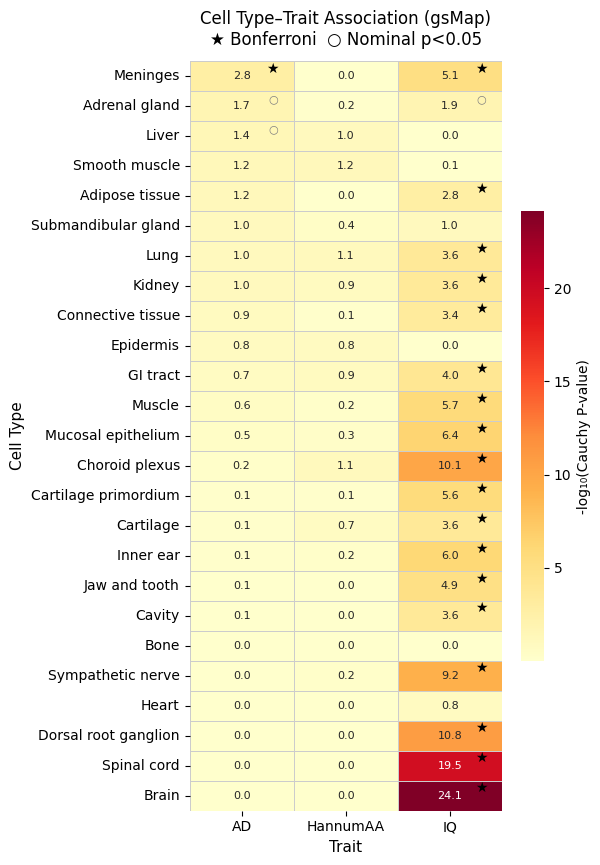

✅ 热图已保存


In [5]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

# 构建热图矩阵：行=细胞类型，列=性状
all_annots = sorted(set().union(*[set(cauchy_all[t]['annotation']) for t in traits]))
heatmap_df = pd.DataFrame(index=all_annots, columns=traits, dtype=float)

for trait in traits:
    df = cauchy_all[trait].set_index('annotation')
    heatmap_df[trait] = df['-log10p']

heatmap_df = heatmap_df.fillna(0)

# 按AD排序
heatmap_df = heatmap_df.sort_values('AD', ascending=False)

# Bonferroni阈值标记
thresholds = {t: -np.log10(0.05 / len(cauchy_all[t])) for t in traits}

fig, ax = plt.subplots(figsize=(6, max(8, len(heatmap_df)*0.35)))
sns.heatmap(
    heatmap_df, ax=ax,
    cmap='YlOrRd', linewidths=0.5, linecolor='#cccccc',
    cbar_kws={'label': '-log₁₀(Cauchy P-value)', 'shrink': 0.6},
    annot=True, fmt='.1f', annot_kws={'size': 8}
)

# 在显著格子上打星号
for i, annot in enumerate(heatmap_df.index):
    for j, trait in enumerate(traits):
        val = cauchy_all[trait].set_index('annotation')['p_cauchy'].get(annot, 1)
        n   = len(cauchy_all[trait])
        if val < 0.05 / n:
            ax.text(j + 0.8, i + 0.25, '★', ha='center', va='center',
                    fontsize=10, color='black')
        elif val < 0.05:
            ax.text(j + 0.8, i + 0.25, '○', ha='center', va='center',
                    fontsize=8, color='gray')

ax.set_title('Cell Type–Trait Association (gsMap)\n★ Bonferroni  ○ Nominal p<0.05',
             fontsize=12, pad=12)
ax.set_xlabel('Trait', fontsize=11)
ax.set_ylabel('Cell Type', fontsize=11)
plt.tight_layout()
plt.savefig(os.path.join(base_dir, 'Figure_multitrait_heatmap.pdf'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(base_dir, 'Figure_multitrait_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ 热图已保存")

In [6]:
# gene_marker: 行=基因, 列=spot
# 需要把spot → 细胞类型，再按细胞类型聚合基因分数

# 先确认h5ad里的注释列名
print(adata.obs.columns.tolist())

# 通常注释列叫 'annotation' 或 'cell_type'，按实际修改
ANNO_COL = 'annotation'   # ← 如果报错，把这里改成adata.obs里实际的列名

# spot → annotation映射
spot_to_annot = adata.obs[ANNO_COL].to_dict()   # {spot_id: annotation}

# 读取gene_marker（大文件，只读一次）
print("读取gene_marker_score（约需1-2分钟）...")
gm = feather.read_feather(
    os.path.join(workdir, 'latent_to_gene', 'E16.5_E1S1.MOSTA_gene_marker_score.feather')
)
gm = gm.set_index('HUMAN_GENE_SYM')   # 16331基因 × 121768 spots

# spot列 → 按细胞类型取均值（内存高效版）
print("按细胞类型聚合基因分数...")
annot_series = pd.Series(spot_to_annot)                      # index=spot, value=annotation
common_spots = gm.columns.intersection(annot_series.index)   # 只取共有spot

# 按注释分组，每组取该组所有spot的均值
celltype_gene_scores = {}
for ct, spots in annot_series[common_spots].groupby(annot_series[common_spots]).groups.items():
    celltype_gene_scores[ct] = gm[spots].mean(axis=1)

ct_gene_df = pd.DataFrame(celltype_gene_scores)  # 16331基因 × N细胞类型
print("细胞类型基因分数矩阵:", ct_gene_df.shape)
print(ct_gene_df.head(3))

['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - AI987944', 'Regulon - Alx1', 'Regulon - Alx4', 'Regulon - Arid3a', 'Regulon - Arnt2', 'Regulon - Arx', 'Regulon - Atf1', 'Regulon - Atf2', 'Regulon - Atf3', 'Regulon - Atf4', 'Regulon - Atf6', 'Regulon - Atoh1', 'Regulon - Bach2', 'Regulon - Barhl1', 'Regulon - Barhl2', 'Regulon - Barx1', 'Regulon - Bcl6', 'Regulon - Bclaf1', 'Regulon - Bdp1', 'Regulon - Bhlhe40', 'Regulon - Bmyc', 'Regulon - Brca1', 'Regulon - Brf1', 'Regulon - Brf2', 'Regulon - Cdx1', 'Regulon - Cdx2', 'Regulon - Cebpa', 'Regulon - Cebpb', 'Regulon - Cebpe', 'Regulon - Cic', 'Regulon - Clock', 'Regulon - Creb1', 'Regulon - Creb3l1', 'Regulon - Creb3l2', 'Regulon - Creb5', 'Regulon - Crebl2', 'Regulon - Ctcf', 'Regulon - Ctcfl', 'Regulon - Cux1', 'Regulon - Dbp', 'Regulon - Dbx1', 'Regulon - Ddit3', 'Regulon - Dlx1', 'Regulon - Dlx2', 'Regulon - Dlx3', 'Regulon - Dlx5', 'Regulon - Dlx6', 'Regulon - Dmbx1', '

In [ ]:
# 已知AD GWAS风险基因（Bellenguez 2022 Nat Genet）
known_AD_genes = {
    'APOE','BIN1','CLU','PICALM','CR1','MS4A6A','CD33','ABCA7',
    'EPHA1','CD2AP','FERMT2','SLC24A4','RIN3','NME8','ZCWPW1',
    'CELF1','PTK2B','SORL1','CASS4','TRIP4','INPP5D','MEF2C',
    'TREM2','PLCG2','ABI3','GRN','ADAM10','ACE','ADAMTS1',
    'APH1B','CLNK','KAT8','WWOX','PRKD3','SHARPIN','SNX1',
    'BIN1','IQCK','HESX1','TMEM163','HLA-DRB5'
}

N_TOP = 100   # 每个细胞类型取Top 100基因

# 针对AD显著细胞类型提取top基因
ad_sig = cauchy_all['AD'][cauchy_all['AD']['bonferroni_sig']]['annotation'].tolist()
ad_nominal = cauchy_all['AD'][cauchy_all['AD']['nominal_sig']]['annotation'].tolist()
print(f"AD Bonferroni显著细胞类型: {ad_sig}")
print(f"AD Nominal显著细胞类型: {ad_nominal}")

top_gene_tables = []
for ct in ad_nominal:
    if ct not in ct_gene_df.columns:
        print(f"警告: {ct} 不在基因分数矩阵中")
        continue
    scores = ct_gene_df[ct].sort_values(ascending=False)
    top = scores.head(N_TOP).reset_index()
    top.columns = ['Gene', 'gsMap_Score']
    top['Rank'] = range(1, len(top)+1)
    top['CellType'] = ct
    top['Known_AD_Gene'] = top['Gene'].isin(known_AD_genes)
    top_gene_tables.append(top)

top_genes_df = pd.concat(top_gene_tables, ignore_index=True)

# 统计每个细胞类型已知AD基因重叠
from scipy import stats

overlap_rows = []
total_genes = len(gm)
for ct in ad_nominal:
    sub = top_genes_df[top_genes_df['CellType'] == ct]
    n_overlap = sub['Known_AD_Gene'].sum()
    overlap_list = sub[sub['Known_AD_Gene']]['Gene'].tolist()
    
    # Fisher检验
    a = n_overlap
    b = N_TOP - a
    c = len(known_AD_genes) - a
    d = total_genes - a - b - c
    _, pval = stats.fisher_exact([[a, b], [c, d]], alternative='greater')
    
    overlap_rows.append({
        'CellType': ct,
        'Top_N': N_TOP,
        'Known_AD_Overlap': n_overlap,
        'Overlap_Genes': ', '.join(overlap_list),
        'Fisher_P': round(pval, 4),
        'Cauchy_P_AD': cauchy_all['AD'].set_index('annotation')['p_cauchy'].get(ct, np.nan)
    })

overlap_df = pd.DataFrame(overlap_rows)
print("\n已知AD基因重叠:")
print(overlap_df.to_string())

In [7]:
output_path = os.path.join(base_dir, 'Supplementary_Tables_gsMap.xlsx')

with pd.ExcelWriter(output_path, engine='openpyxl') as writer:

    # Table S1: 三个性状Cauchy汇总
    for trait in traits:
        df_out = cauchy_all[trait][['annotation','p_cauchy','p_median','-log10p','bonferroni_sig','nominal_sig']].copy()
        df_out.columns = ['Cell Type','P Cauchy','P Median','-log10P','Bonferroni Sig','Nominal Sig']
        df_out.to_excel(writer, sheet_name=f'S1 {trait} CellType', index=False)

    # Table S2: AD显著细胞类型 Top基因
    top_out = top_genes_df[['CellType','Rank','Gene','gsMap_Score','Known_AD_Gene']].copy()
    top_out.columns = ['Cell Type','Rank','Gene','gsMap Score','Known AD Gene']
    top_out.to_excel(writer, sheet_name='S2 AD Top Genes', index=False)

    # Table S3: 已知AD基因重叠 + Fisher检验
    overlap_df.to_excel(writer, sheet_name='S3 AD Gene Overlap Fisher', index=False)

    # Table S4: 多性状-细胞类型矩阵（热图原始数据）
    heatmap_out = heatmap_df.copy()
    heatmap_out.index.name = 'Cell Type'
    heatmap_out.to_excel(writer, sheet_name='S4 Multitrait Matrix')

print(f"✅ 支撑表已保存: {output_path}")
```

---

### 运行顺序和注意点

Cell 3 运行时间最长（约2-5分钟），因为gene_marker是16331×121768的大矩阵。

Cell 3成功后请把这两行输出发给我：
```
adata.obs列名: [...]
细胞类型基因分数矩阵: (行数, 列数)

SyntaxError: invalid character '（' (U+FF08) (1809088162.py, line 31)

In [8]:
import pandas as pd
import numpy as np
import os
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import pyarrow.feather as feather
from scipy import stats
from matplotlib.colors import LinearSegmentedColormap

# ============ 路径配置 ============
base_dir = r'C:\Users\13918\Desktop\MR'
workdir  = os.path.join(base_dir, 'example_quick_mode', 'Mouse_Embryo', 'E16.5_E1S1.MOSTA')

# 创建输出文件夹
out_dir = os.path.join(base_dir, 'AD_gsMap_results')
os.makedirs(out_dir, exist_ok=True)
print(f"输出目录: {out_dir}")

# ============ 1. 读取数据 ============
# Cauchy结果
cauchy = pd.read_csv(os.path.join(workdir, 'cauchy_combination', 'E16.5_E1S1.MOSTA_AD.Cauchy.csv.gz'))
n_tests = len(cauchy)
cauchy['-log10p'] = -np.log10(cauchy['p_cauchy'].clip(lower=1e-300))
cauchy['bonferroni_sig'] = cauchy['p_cauchy'] < (0.05 / n_tests)
cauchy['nominal_sig']    = cauchy['p_cauchy'] < 0.05
cauchy = cauchy.sort_values('p_cauchy')

# spatial_ldsc（spot级别z分数）
ldsc = pd.read_csv(os.path.join(workdir, 'spatial_ldsc', 'E16.5_E1S1.MOSTA_AD.csv.gz'))
ldsc_dict = ldsc.set_index('spot')['z'].to_dict()

# h5ad
adata = sc.read_h5ad(os.path.join(workdir, 'find_latent_representations', 'E16.5_E1S1.MOSTA_add_latent.h5ad'))

# 自动检测注释列
obs_cols = adata.obs.columns.tolist()
print("adata.obs列名:", obs_cols)
ANNO_COL = next((c for c in obs_cols if c.lower() in ['annotation','cell_type','celltype','annot']), obs_cols[0])
print(f"使用注释列: {ANNO_COL}")

# 把AD z分数挂到adata.obs
adata.obs['AD_z'] = adata.obs_names.map(ldsc_dict)

# 显著细胞类型
sig_cts     = cauchy[cauchy['bonferroni_sig']]['annotation'].tolist()
nominal_cts = cauchy[cauchy['nominal_sig']]['annotation'].tolist()
print(f"\nBonferroni显著: {sig_cts}")
print(f"Nominal显著:    {nominal_cts}")

# ============ 2. 图1：细胞类型注释空间图（对照组织图）============
fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.embedding(
    adata, basis='spatial',
    color=ANNO_COL,
    ax=ax, show=False,
    title='Cell Type Annotation\n(E16.5 Mouse Embryo)',
    legend_loc='right margin',
    legend_fontsize=7,
    size=2
)
plt.tight_layout()
fig.savefig(os.path.join(out_dir, 'Fig1_celltype_annotation.pdf'), dpi=300, bbox_inches='tight')
fig.savefig(os.path.join(out_dir, 'Fig1_celltype_annotation.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Fig1 saved")

# ============ 3. 图2：AD gsMap分数空间热图 ============
fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.embedding(
    adata, basis='spatial',
    color='AD_z',
    ax=ax, show=False,
    color_map='RdBu_r',
    vcenter=0,
    title='AD gsMap Association Score\n(Spatial LDSC z-score)',
    size=2,
    colorbar_loc='right'
)
plt.tight_layout()
fig.savefig(os.path.join(out_dir, 'Fig2_AD_gsMap_spatial.pdf'), dpi=300, bbox_inches='tight')
fig.savefig(os.path.join(out_dir, 'Fig2_AD_gsMap_spatial.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Fig2 saved")

# ============ 4. 图3：AD Cauchy富集条形图 ============
fig, ax = plt.subplots(figsize=(8, max(5, len(cauchy) * 0.35)))

colors = ['#C0392B' if b else ('#E67E22' if n else '#95A5A6')
          for b, n in zip(cauchy['bonferroni_sig'], cauchy['nominal_sig'])]

ax.barh(cauchy['annotation'], cauchy['-log10p'], color=colors, edgecolor='white', linewidth=0.4)

bonf_thresh = -np.log10(0.05 / n_tests)
ax.axvline(x=bonf_thresh, color='#C0392B', linestyle='--', linewidth=1.2,
           label=f'Bonferroni (p={0.05/n_tests:.1e})')
ax.axvline(x=-np.log10(0.05), color='#E67E22', linestyle=':', linewidth=1.2,
           label='Nominal (p=0.05)')

ax.set_xlabel('-log₁₀(Cauchy P-value)', fontsize=12)
ax.set_title('Cell Type Enrichment for AD\n(gsMap Cauchy Combination)', fontsize=13)
ax.legend(fontsize=9, loc='lower right')
ax.invert_yaxis()
plt.tight_layout()
fig.savefig(os.path.join(out_dir, 'Fig3_AD_cauchy_barplot.pdf'), dpi=300, bbox_inches='tight')
fig.savefig(os.path.join(out_dir, 'Fig3_AD_cauchy_barplot.png'), dpi=300, bbox_inches='tight')
plt.show()
print("✅ Fig3 saved")

# ============ 5. 图4：Top基因条形图（按显著细胞类型）============
print("\n读取gene_marker_score（约1-2分钟）...")
gm = feather.read_feather(
    os.path.join(workdir, 'latent_to_gene', 'E16.5_E1S1.MOSTA_gene_marker_score.feather')
).set_index('HUMAN_GENE_SYM')

spot_to_annot = adata.obs[ANNO_COL]
common_spots  = gm.columns.intersection(spot_to_annot.index)

# 按细胞类型取均值
print("聚合基因分数...")
ct_gene_scores = {}
for ct, spots in spot_to_annot[common_spots].groupby(spot_to_annot[common_spots]).groups.items():
    ct_gene_scores[ct] = gm[spots].mean(axis=1)
ct_gene_df = pd.DataFrame(ct_gene_scores)

# 已知AD基因
known_AD = {'APOE','BIN1','CLU','PICALM','CR1','MS4A6A','CD33','ABCA7',
            'EPHA1','CD2AP','FERMT2','SLC24A4','SORL1','TREM2','PLCG2',
            'ABI3','GRN','ADAM10','ACE','INPP5D','MEF2C','PTK2B','CELF1'}

target_cts = nominal_cts if nominal_cts else cauchy.head(3)['annotation'].tolist()
N_TOP = 20

for ct in target_cts:
    if ct not in ct_gene_df.columns:
        continue
    top = ct_gene_df[ct].sort_values(ascending=False).head(N_TOP)
    is_known = top.index.isin(known_AD)
    bar_colors = ['#C0392B' if k else '#3498DB' for k in is_known]

    fig, ax = plt.subplots(figsize=(7, 5))
    ax.barh(top.index[::-1], top.values[::-1], color=bar_colors[::-1], edgecolor='white')
    ax.set_xlabel('gsMap Gene Score', fontsize=11)
    ax.set_title(f'Top {N_TOP} AD-Associated Genes\n{ct}', fontsize=12)

    from matplotlib.patches import Patch
    ax.legend(handles=[
        Patch(color='#C0392B', label='Known AD GWAS gene'),
        Patch(color='#3498DB', label='Other gene')
    ], fontsize=9)

    plt.tight_layout()
    safe_ct = ct.replace(' ', '_').replace('/', '_')
    fig.savefig(os.path.join(out_dir, f'Fig4_TopGenes_{safe_ct}.pdf'), dpi=300, bbox_inches='tight')
    fig.savefig(os.path.join(out_dir, f'Fig4_TopGenes_{safe_ct}.png'), dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Fig4 saved: {ct}")

# ============ 6. 支撑表 ============
# 收集Top基因
all_top = []
for ct in target_cts:
    if ct not in ct_gene_df.columns:
        continue
    top = ct_gene_df[ct].sort_values(ascending=False).head(100).reset_index()
    top.columns = ['Gene', 'gsMap_Score']
    top['Rank'] = range(1, 101)
    top['CellType'] = ct
    top['Known_AD_Gene'] = top['Gene'].isin(known_AD)
    all_top.append(top)
top_df = pd.concat(all_top, ignore_index=True)

xlsx_path = os.path.join(out_dir, 'Supplementary_Tables_AD_gsMap.xlsx')
with pd.ExcelWriter(xlsx_path, engine='openpyxl') as writer:
    # S1: Cauchy结果
    cauchy[['annotation','p_cauchy','p_median','-log10p','bonferroni_sig','nominal_sig']]\
        .rename(columns={'annotation':'Cell Type','p_cauchy':'P Cauchy',
                         'p_median':'P Median','bonferroni_sig':'Bonferroni Sig',
                         'nominal_sig':'Nominal Sig'})\
        .to_excel(writer, sheet_name='S1 AD CellType Enrichment', index=False)
    # S2: Top基因
    top_df[['CellType','Rank','Gene','gsMap_Score','Known_AD_Gene']]\
        .rename(columns={'CellType':'Cell Type','gsMap_Score':'gsMap Score',
                         'Known_AD_Gene':'Known AD Gene'})\
        .to_excel(writer, sheet_name='S2 AD Top Genes', index=False)

print(f"\n{'='*50}")
print(f"✅ 全部完成！输出目录: {out_dir}")
print(f"   Fig1_celltype_annotation.pdf/png")
print(f"   Fig2_AD_gsMap_spatial.pdf/png")
print(f"   Fig3_AD_cauchy_barplot.pdf/png")
print(f"   Fig4_TopGenes_[细胞类型].pdf/png")
print(f"   Supplementary_Tables_AD_gsMap.xlsx")
```

运行后所有文件都在：
```
C:\Users\13918\Desktop\MR\AD_gsMap_results\

SyntaxError: invalid character '：' (U+FF1A) (1217329112.py, line 197)

In [1]:
import pandas as pd

ldsc_path = r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\spatial_ldsc\E16.5_E1S1.MOSTA_HannumAA.csv.gz'
df = pd.read_csv(ldsc_path, compression='gzip', nrows=5)
print(df.columns.tolist())
print(df.head())

['spot', 'beta', 'se', 'z', 'p']
      spot          beta            se         z         p
0  190_194 -1.460794e-08  9.934464e-09 -1.470431  0.929277
1  190_195 -5.018417e-09  5.157631e-09 -0.973008  0.834725
2  190_196 -5.957574e-09  4.767880e-09 -1.249523  0.894263
3  190_197 -3.816327e-09  4.596616e-09 -0.830247  0.796800
4  190_198 -4.517857e-09  4.840953e-09 -0.933258  0.824657


Loading h5ad ...
Loading spatial LDSC ...
Using annotation column: annotation
Obs columns: ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - AI987944', 'Regulon - Alx1', 'Regulon - Alx4', 'Regulon - Arid3a', 'Regulon - Arnt2', 'Regulon - Arx', 'Regulon - Atf1', 'Regulon - Atf2', 'Regulon - Atf3', 'Regulon - Atf4', 'Regulon - Atf6', 'Regulon - Atoh1', 'Regulon - Bach2', 'Regulon - Barhl1', 'Regulon - Barhl2', 'Regulon - Barx1', 'Regulon - Bcl6', 'Regulon - Bclaf1', 'Regulon - Bdp1', 'Regulon - Bhlhe40', 'Regulon - Bmyc', 'Regulon - Brca1', 'Regulon - Brf1', 'Regulon - Brf2', 'Regulon - Cdx1', 'Regulon - Cdx2', 'Regulon - Cebpa', 'Regulon - Cebpb', 'Regulon - Cebpe', 'Regulon - Cic', 'Regulon - Clock', 'Regulon - Creb1', 'Regulon - Creb3l1', 'Regulon - Creb3l2', 'Regulon - Creb5', 'Regulon - Crebl2', 'Regulon - Ctcf', 'Regulon - Ctcfl', 'Regulon - Cux1', 'Regulon - Dbp', 'Regulon - Dbx1', 'Regulon - Ddit3', 'Regulon - Dlx1', '

C:\Users\13918\AppData\Local\Temp\ipykernel_46904\1344987002.py:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_cat = plt.cm.get_cmap('tab20', n_types)


图片已保存至: C:\Users\13918\Desktop\MR\Fig6AB_revised.pdf


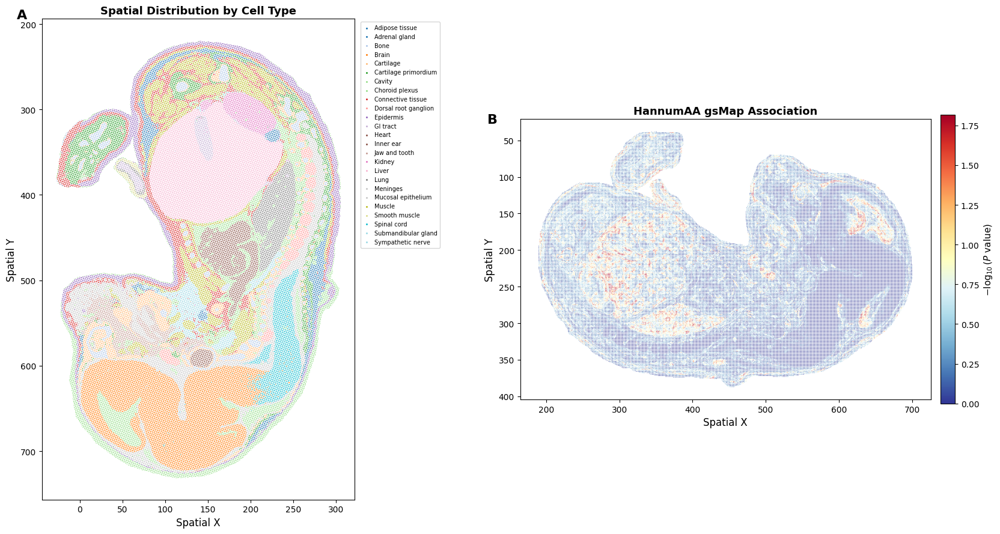

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import scanpy as sc
from scipy.stats import rankdata

# ============================================================
# 路径配置
# ============================================================
h5ad_path = r'C:\Users\13918\Desktop\MR\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad'
ldsc_path  = r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\spatial_ldsc\E16.5_E1S1.MOSTA_HannumAA.csv.gz'
cauchy_path= r'C:\Users\13918\Desktop\MR\example_quick_mode\Mouse_Embryo\E16.5_E1S1.MOSTA\cauchy_combination\E16.5_E1S1.MOSTA_HannumAA.Cauchy.csv.gz'
out_path   = r'C:\Users\13918\Desktop\MR\Fig6AB_revised.pdf'

# ============================================================
# 1. 读取数据
# ============================================================
print("Loading h5ad ...")
adata = sc.read_h5ad(h5ad_path)

# 解析空间坐标（spot列格式 x_y）
print("Loading spatial LDSC ...")
ldsc_df = pd.read_csv(ldsc_path, compression='gzip')
ldsc_df[['x', 'y']] = ldsc_df['spot'].str.split('_', expand=True).astype(int)

# 读取Cauchy结果
cauchy_df = pd.read_csv(cauchy_path, compression='gzip')
cauchy_df = cauchy_df.sort_values('p_cauchy')

# ============================================================
# 2. 从h5ad获取细胞类型注释 + 坐标
# ============================================================
# 尝试常见的注释列名
annot_col = None
for col in ['annotation', 'celltype', 'cell_type', 'tissue', 'Annotation']:
    if col in adata.obs.columns:
        annot_col = col
        break
print(f"Using annotation column: {annot_col}")
print(f"Obs columns: {adata.obs.columns.tolist()}")

# 获取空间坐标
if 'spatial' in adata.obsm:
    coords = adata.obsm['spatial']
    x_all = coords[:, 0]
    y_all = coords[:, 1]
else:
    # 尝试从obs中获取
    x_all = adata.obs['x'].values
    y_all = adata.obs['y'].values

annotations = adata.obs[annot_col].values

# ============================================================
# 3. 配色方案
# ============================================================
unique_annots = sorted(set(annotations))
n_types = len(unique_annots)
cmap_cat = plt.cm.get_cmap('tab20', n_types)
color_dict = {ann: cmap_cat(i) for i, ann in enumerate(unique_annots)}

# ============================================================
# 4. 绘图
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(18, 9))

# ---------- Fig 6A: 细胞类型空间分布（y轴反转）----------
ax = axes[0]
for ann in unique_annots:
    mask = annotations == ann
    ax.scatter(
        x_all[mask], y_all[mask],
        c=[color_dict[ann]],
        s=0.3, linewidths=0, label=ann, rasterized=True
    )

ax.set_xlabel('Spatial X', fontsize=12)
ax.set_ylabel('Spatial Y', fontsize=12)
ax.set_title('Spatial Distribution by Cell Type', fontsize=13, fontweight='bold')
ax.invert_yaxis()   # ← 审稿人要求的修改

# 图例放右侧，缩小字体
legend = ax.legend(
    bbox_to_anchor=(1.01, 1), loc='upper left',
    fontsize=7, markerscale=4, frameon=True,
    handlelength=1, borderpad=0.5
)
ax.set_aspect('equal')
ax.text(-0.08, 1.02, 'A', transform=ax.transAxes,
        fontsize=16, fontweight='bold', va='top')

# ---------- Fig 6B: gsMap p值热图（y轴反转）----------
ax2 = axes[1]

# 将ldsc_df的p值映射到颜色
ldsc_df['neglog10p'] = -np.log10(ldsc_df['p'].clip(1e-300))

scatter = ax2.scatter(
    ldsc_df['x'], ldsc_df['y'],
    c=ldsc_df['neglog10p'],
    cmap='RdYlBu_r',
    s=0.3, linewidths=0,
    vmin=0, vmax=ldsc_df['neglog10p'].quantile(0.99),
    rasterized=True
)

cbar = plt.colorbar(scatter, ax=ax2, shrink=0.6, pad=0.02)
cbar.set_label(r'$-\log_{10}(P\ \mathrm{value})$', fontsize=11)

ax2.set_xlabel('Spatial X', fontsize=12)
ax2.set_ylabel('Spatial Y', fontsize=12)
ax2.set_title('HannumAA gsMap Association', fontsize=13, fontweight='bold')
ax2.invert_yaxis()   # y轴同步反转保持一致
ax2.set_aspect('equal')
ax2.text(-0.08, 1.02, 'B', transform=ax2.transAxes,
         fontsize=16, fontweight='bold', va='top')

plt.tight_layout()
plt.savefig(out_path, dpi=300, bbox_inches='tight')
print(f"图片已保存至: {out_path}")
plt.show()

Loading h5ad ...
Using annotation column: annotation
图片已保存: C:\Users\13918\Desktop\MR\Fig6A_revised.pdf


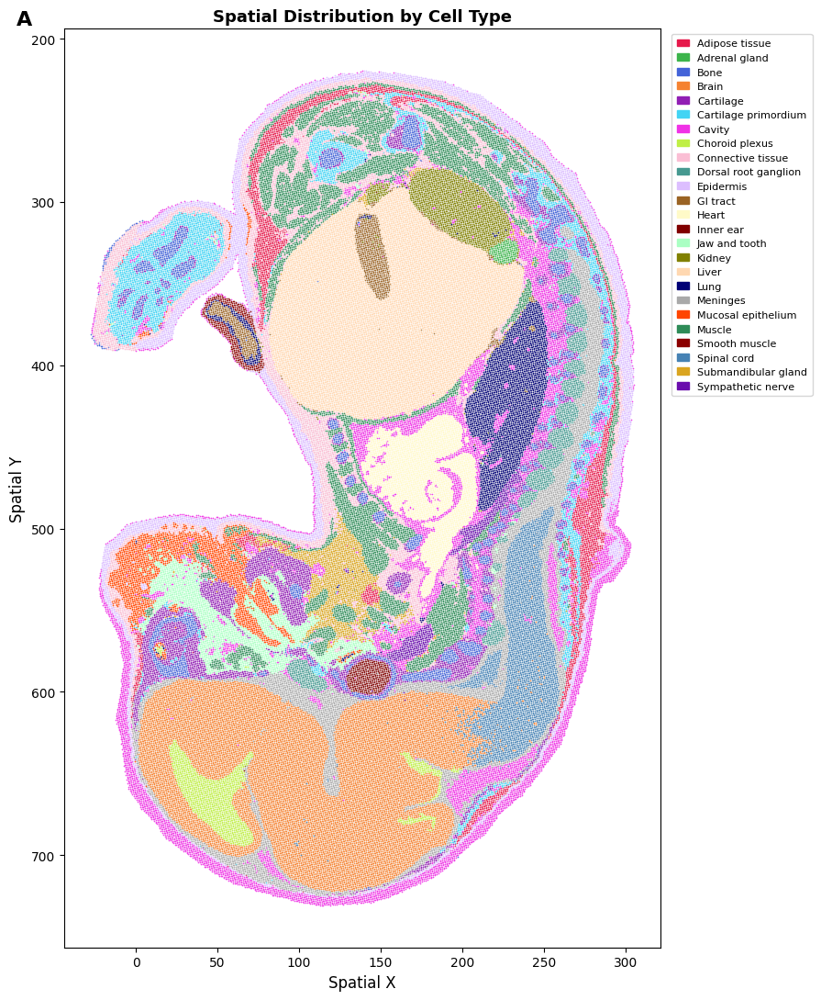

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import scanpy as sc

# ============================================================
# 路径配置
# ============================================================
h5ad_path  = r'C:\Users\13918\Desktop\MR\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad'
out_path   = r'C:\Users\13918\Desktop\MR\Fig6A_revised.pdf'

# ============================================================
# 读取数据
# ============================================================
print("Loading h5ad ...")
adata = sc.read_h5ad(h5ad_path)

# 自动检测注释列
annot_col = None
for col in ['annotation', 'celltype', 'cell_type', 'tissue', 'Annotation']:
    if col in adata.obs.columns:
        annot_col = col
        break
print(f"Using annotation column: {annot_col}")

# 获取空间坐标
if 'spatial' in adata.obsm:
    coords = adata.obsm['spatial']
    x_all  = coords[:, 0]
    y_all  = coords[:, 1]
else:
    x_all = adata.obs['x'].values
    y_all = adata.obs['y'].values

annotations = adata.obs[annot_col].values

# ============================================================
# 配色：25种组织，使用更鲜明的颜色
# ============================================================
distinct_colors = [
    '#E6194B','#3CB44B','#4363D8','#F58231','#911EB4',
    '#42D4F4','#F032E6','#BFEF45','#FABED4','#469990',
    '#DCBEFF','#9A6324','#FFFAC8','#800000','#AAFFC3',
    '#808000','#FFD8B1','#000075','#A9A9A9','#FF4500',
    '#2E8B57','#8B0000','#4682B4','#DAA520','#6A0DAD'
]

unique_annots = sorted(set(annotations))
color_dict = {ann: distinct_colors[i % len(distinct_colors)]
              for i, ann in enumerate(unique_annots)}

# ============================================================
# 绘图：Fig 6A（y轴反转，颜色鲜明）
# ============================================================
fig, ax = plt.subplots(figsize=(10, 11))

for ann in unique_annots:
    mask = annotations == ann
    ax.scatter(
        x_all[mask], y_all[mask],
        c=color_dict[ann],
        s=1.5,           # 增大点size
        linewidths=0,
        label=ann,
        rasterized=True,
        alpha=0.9        # 接近不透明
    )

ax.set_xlabel('Spatial X', fontsize=12)
ax.set_ylabel('Spatial Y', fontsize=12)
ax.set_title('Spatial Distribution by Cell Type', fontsize=13, fontweight='bold')

# 关键修改：反转Y轴
ax.invert_yaxis()
ax.set_aspect('equal')

# 图例
legend_handles = [
    mpatches.Patch(color=color_dict[ann], label=ann)
    for ann in unique_annots
]
ax.legend(
    handles=legend_handles,
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    fontsize=8,
    frameon=True,
    handlelength=1.2,
    borderpad=0.5
)

ax.text(-0.08, 1.02, 'A', transform=ax.transAxes,
        fontsize=16, fontweight='bold', va='top')

plt.tight_layout()
plt.savefig(out_path, dpi=300, bbox_inches='tight')
print(f"图片已保存: {out_path}")
plt.show()

X范围: -27.6 ~ 305.1
Y范围: 219.5 ~ 731.0


C:\Users\13918\AppData\Local\Temp\ipykernel_46904\650457754.py:50: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\13918\AppData\Local\Temp\ipykernel_46904\650457754.py:50: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\13918\AppData\Local\Temp\ipykernel_46904\650457754.py:50: UserWarning: Glyph 21453 (\N{CJK UNIFIED IDEOGRAPH-53CD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\13918\AppData\Local\Temp\ipykernel_46904\650457754.py:50: UserWarning: Glyph 36716 (\N{CJK UNIFIED IDEOGRAPH-8F6C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\13918\AppData\Local\Temp\ipykernel_46904\650457754.py:51: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  plt.savefig(r'C:\Users\13918\Desktop\MR\Fig6A_compare.pdf', dpi=150, bbox_inches='tight')
C:\Users\13918\AppData\Local\

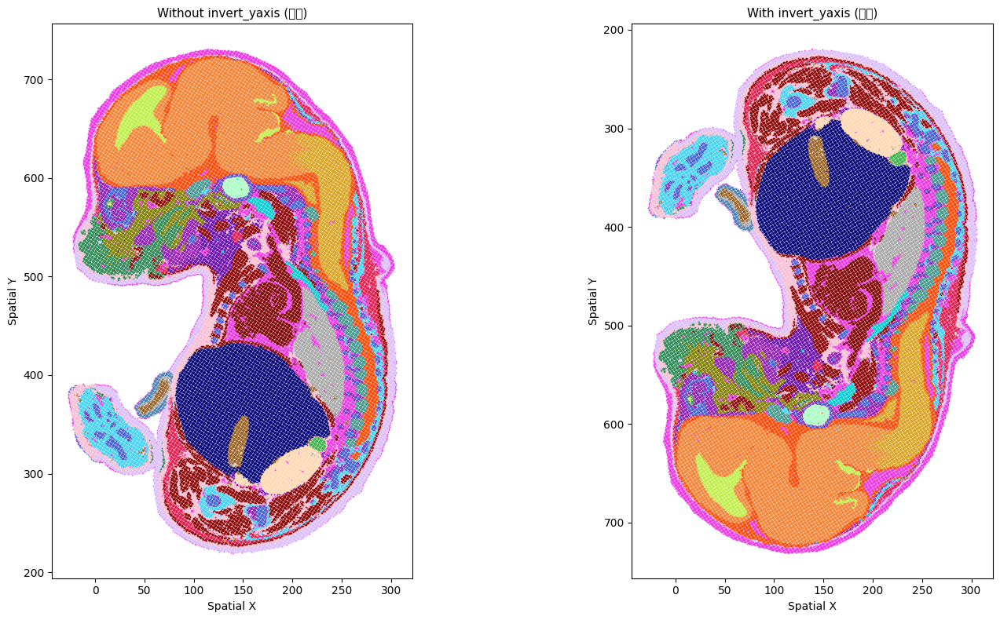

In [5]:
import scanpy as sc
import matplotlib.pyplot as plt

h5ad_path = r'C:\Users\13918\Desktop\MR\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad'
adata = sc.read_h5ad(h5ad_path)

# 检查坐标范围和方向
if 'spatial' in adata.obsm:
    coords = adata.obsm['spatial']
    x_all = coords[:, 0]
    y_all = coords[:, 1]

print(f"X范围: {x_all.min():.1f} ~ {x_all.max():.1f}")
print(f"Y范围: {y_all.min():.1f} ~ {y_all.max():.1f}")

# 同时画两张对比图
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

annot_col = 'annotation'
annotations = adata.obs[annot_col].values
unique_annots = sorted(set(annotations))

colors = [
    '#E6194B','#3CB44B','#4363D8','#F58231','#911EB4',
    '#42D4F4','#F032E6','#BFEF45','#FABED4','#469990',
    '#DCBEFF','#9A6324','#800000','#AAFFC3','#808000',
    '#FFD8B1','#000075','#A9A9A9','#FF4500','#2E8B57',
    '#8B0000','#4682B4','#DAA520','#6A0DAD','#00CED1'
]
color_dict = {ann: colors[i % len(colors)] for i, ann in enumerate(unique_annots)}

for idx, (ax, title, invert) in enumerate(zip(
    axes,
    ['Without invert_yaxis (原始)', 'With invert_yaxis (反转)'],
    [False, True]
)):
    for ann in unique_annots:
        mask = annotations == ann
        ax.scatter(x_all[mask], y_all[mask],
                   c=color_dict[ann], s=1.5,
                   linewidths=0, label=ann,
                   rasterized=True, alpha=0.9)
    if invert:
        ax.invert_yaxis()
    ax.set_title(title, fontsize=11)
    ax.set_xlabel('Spatial X')
    ax.set_ylabel('Spatial Y')
    ax.set_aspect('equal')

plt.tight_layout()
plt.savefig(r'C:\Users\13918\Desktop\MR\Fig6A_compare.pdf', dpi=150, bbox_inches='tight')
plt.show()

保存至: C:\Users\13918\Desktop\MR\Fig6A_final.pdf


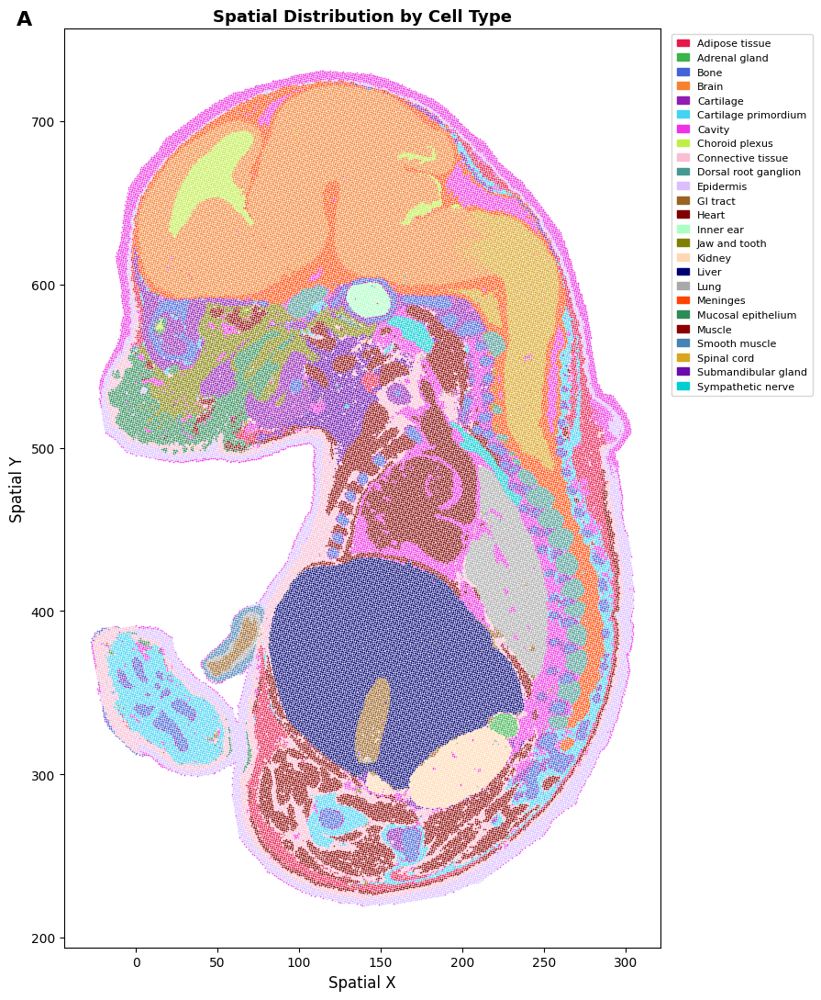

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import scanpy as sc

h5ad_path = r'C:\Users\13918\Desktop\MR\gsMap_example_data\ST\E16.5_E1S1.MOSTA.h5ad'
out_path  = r'C:\Users\13918\Desktop\MR\Fig6A_final.pdf'

adata = sc.read_h5ad(h5ad_path)
annot_col = 'annotation'
annotations = adata.obs[annot_col].values

coords = adata.obsm['spatial']
x_all  = coords[:, 0]
y_all  = coords[:, 1]

colors = [
    '#E6194B','#3CB44B','#4363D8','#F58231','#911EB4',
    '#42D4F4','#F032E6','#BFEF45','#FABED4','#469990',
    '#DCBEFF','#9A6324','#800000','#AAFFC3','#808000',
    '#FFD8B1','#000075','#A9A9A9','#FF4500','#2E8B57',
    '#8B0000','#4682B4','#DAA520','#6A0DAD','#00CED1'
]
unique_annots = sorted(set(annotations))
color_dict = {ann: colors[i % len(colors)] for i, ann in enumerate(unique_annots)}

fig, ax = plt.subplots(figsize=(10, 11))

for ann in unique_annots:
    mask = annotations == ann
    ax.scatter(
        x_all[mask], y_all[mask],
        c=color_dict[ann],
        s=1.5,
        linewidths=0,
        label=ann,
        rasterized=True,
        alpha=0.9
    )

ax.set_xlabel('Spatial X', fontsize=12)
ax.set_ylabel('Spatial Y', fontsize=12)
ax.set_title('Spatial Distribution by Cell Type', fontsize=13, fontweight='bold')
ax.set_aspect('equal')

# 不反转Y轴，方向已经正确
legend_handles = [
    mpatches.Patch(color=color_dict[ann], label=ann)
    for ann in unique_annots
]
ax.legend(
    handles=legend_handles,
    bbox_to_anchor=(1.01, 1),
    loc='upper left',
    fontsize=8,
    frameon=True,
    handlelength=1.2,
    borderpad=0.5
)

ax.text(-0.08, 1.02, 'A', transform=ax.transAxes,
        fontsize=16, fontweight='bold', va='top')

plt.tight_layout()
plt.savefig(out_path, dpi=300, bbox_inches='tight')
print(f"保存至: {out_path}")
plt.show()